### 초기 경로 설정 (클래스 이용을 위함)

In [2]:
%cd /project/segmentation/smcho1201/segmentation_project

/project/segmentation/smcho1201/segmentation_project


In [3]:
# files and system
import os
import sys
import time
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from IPython.display import clear_output
# working with images
import cv2
import imageio
import scipy.ndimage
# import skimage.transform

import torchvision.transforms as transforms

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F


import torchsummary
from tqdm import notebook

sys.path.insert(0, '..')

# losses
from utils.metrics import iou_pytorch_eval, IoULoss, IoUBCELoss, DiceBCELoss , dice_pytorch_eval
from utils.metrics import iou_pytorch_test, dice_pytorch_test, precision_pytorch_test, recall_pytorch_test, fbeta_pytorch_test, accuracy_pytorch_test

# dataset
from utils.dataset import myDataSet

## 랜덤성을 배제한 환경 고정

In [4]:
random_seed= 42
random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True

In [5]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu") # select device for training, i.e. gpu or cpu
print(DEVICE)

cuda


# 1. Image augentation
> 실험할 때는 아예 augmentation도 고정시켜서 저장한 이미지를 사용해야 함.

In [6]:
_size = 224, 224
resize = transforms.Resize(_size, interpolation=0)

# set your transforms 
train_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                           transforms.RandomRotation(180),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(_size, padding = 10), # needed after rotation (with original size)
                       ])

test_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                       ])

/home/ehdgus575/.conda/envs/cuda_setting/lib/python3.9/site-packages/torchvision/transforms/transforms.py:332: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(


# 2. 데이터셋 클래스 생성
> 해당 클래스는 이용하려는 이미지와 라벨의 모든 경로(/data/segmentation/...)의 리스트를 인자로 받는다.   

In [7]:
train_images = glob.glob('/data/segmentation/Kvasir-SEG/trainset/images/*')
train_labels = glob.glob('/data/segmentation/Kvasir-SEG/trainset/labels/*')
train_images = [img for img in train_images if img.find('jpg')!= -1] # super pixels 이미지 제외

valid_images = glob.glob('/data/segmentation/Kvasir-SEG/validationset/images/*')
valid_labels = glob.glob('/data/segmentation/Kvasir-SEG/validationset/labels/*')
valid_images = [img for img in valid_images if img.find('jpg')!= -1] # super pixels 이미지 제외

train_images = sorted(train_images)
train_labels = sorted(train_labels)

valid_images = sorted(valid_images)
valid_labels = sorted(valid_labels)

# 데이터셋 클래스 적용
custom_dataset_train = myDataSet(train_images, train_labels, transforms=test_transforms)
print("My custom training-dataset has {} elements".format(len(custom_dataset_train)))

custom_dataset_val = myDataSet(valid_images, valid_labels, transforms=test_transforms)
print("My custom valing-dataset has {} elements".format(len(custom_dataset_val)))

My custom training-dataset has 800 elements
My custom valing-dataset has 200 elements


### dataset class check
> RGB 채널 평균 값이라 색 바뀜

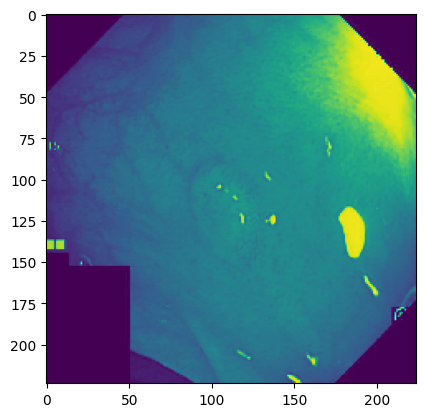

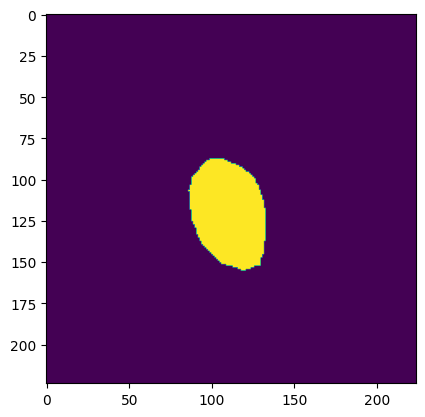

3픽셀의 평균값이라 색깔이 변경됨.


In [8]:
# Show example images.
image_number = 23
img, mask = custom_dataset_train.__getitem__(image_number)

# image
plt.figure()
plt.imshow(img.mean(0)) # 3 channels, take mean

# mask
plt.figure()
plt.imshow(mask[0, :, :]) # 1 channel, take it

plt.show()
print('3픽셀의 평균값이라 색깔이 변경됨.')

# 3. 모델 클래스 생성

In [6]:
from models.sotor_medical_seg_models.ESFPNet.ESFPmodel import ESFPNetStructure

model = ESFPNetStructure(embedding_dim = 224)
model = model.to(DEVICE)

# 4. 하이퍼 파라미터 세팅 & 데이터 로더 생성

In [10]:
# Define variables for the training
epochs = 100
patience = 20
BATCH_SIZE = 8

dataloader_train = torch.utils.data.DataLoader(custom_dataset_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
dataloader_val = torch.utils.data.DataLoader(custom_dataset_val, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [11]:
# Define optimiser and criterion for the training. You can try different ones to see which works best for your data and task
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4, weight_decay = 1e-8)

criterion = DiceBCELoss()
model_name = 'ESFPNet'
data_name = 'Kvasir'

# 5. Training

/home/ehdgus575/.conda/envs/cuda_setting/lib/python3.9/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


 Epoch: 1 of 100, Iter.: 100 of 100, Train Loss: 0.608301, IoU: 0.501921, Dice: 0.617522
 Epoch: 1 of 100, Iter.: 100 of 100, Valid Loss: 0.458452, IoU: 0.634581, Dice: 0.750310

시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.


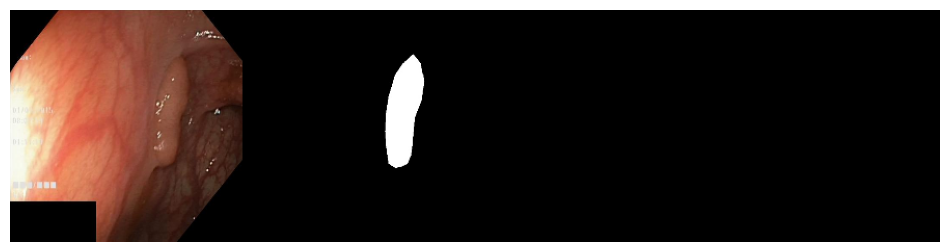

 Epoch: 2 of 100, Iter.: 100 of 100, Train Loss: 0.395704, IoU: 0.649398, Dice: 0.758571
 Epoch: 2 of 100, Iter.: 100 of 100, Valid Loss: 0.393737, IoU: 0.677027, Dice: 0.791383


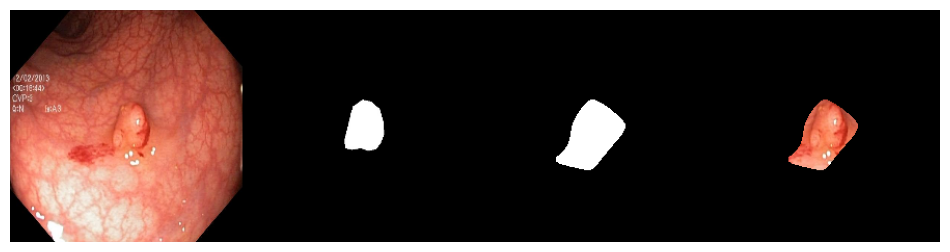

 Epoch: 3 of 100, Iter.: 100 of 100, Train Loss: 0.304197, IoU: 0.718065, Dice: 0.817436
 Epoch: 3 of 100, Iter.: 100 of 100, Valid Loss: 0.388518, IoU: 0.698939, Dice: 0.798263


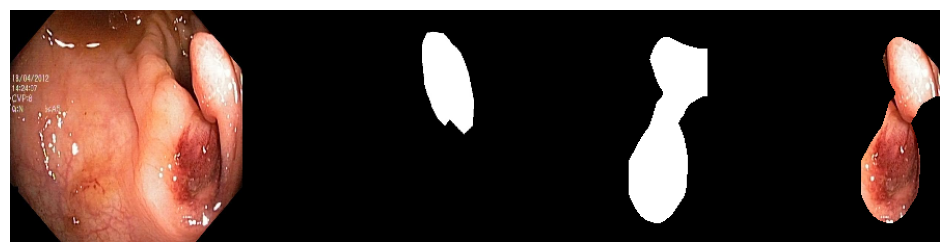

 Epoch: 4 of 100, Iter.: 100 of 100, Train Loss: 0.238366, IoU: 0.762764, Dice: 0.850222
 Epoch: 4 of 100, Iter.: 100 of 100, Valid Loss: 0.332887, IoU: 0.747995, Dice: 0.841260


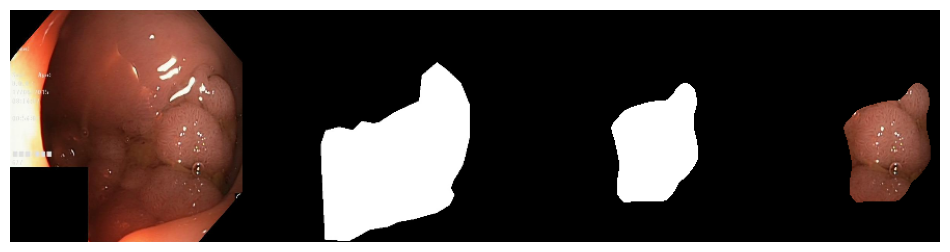

 Epoch: 5 of 100, Iter.: 100 of 100, Train Loss: 0.194395, IoU: 0.795349, Dice: 0.872909
 Epoch: 5 of 100, Iter.: 100 of 100, Valid Loss: 0.329821, IoU: 0.751459, Dice: 0.841956


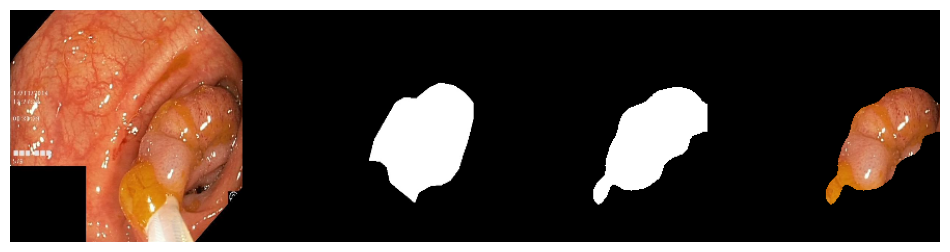

 Epoch: 6 of 100, Iter.: 100 of 100, Train Loss: 0.168205, IoU: 0.813867, Dice: 0.887089
 Epoch: 6 of 100, Iter.: 100 of 100, Valid Loss: 0.313744, IoU: 0.767707, Dice: 0.854637


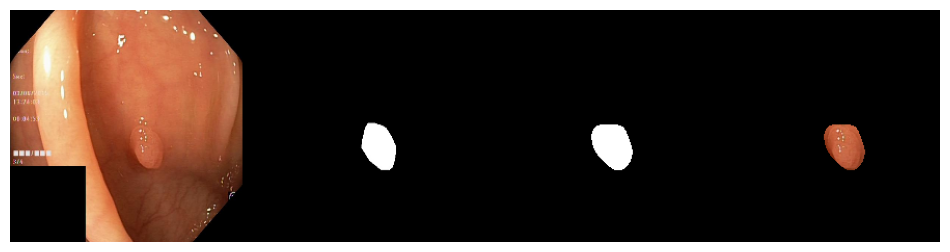

 Epoch: 7 of 100, Iter.: 100 of 100, Train Loss: 0.156493, IoU: 0.830359, Dice: 0.898803
 Epoch: 7 of 100, Iter.: 100 of 100, Valid Loss: 0.307012, IoU: 0.771177, Dice: 0.856016


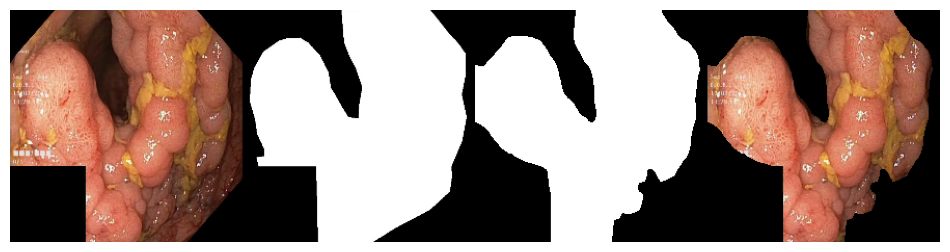

 Epoch: 8 of 100, Iter.: 100 of 100, Train Loss: 0.148298, IoU: 0.830821, Dice: 0.897722
 Epoch: 8 of 100, Iter.: 100 of 100, Valid Loss: 0.325791, IoU: 0.764957, Dice: 0.852028


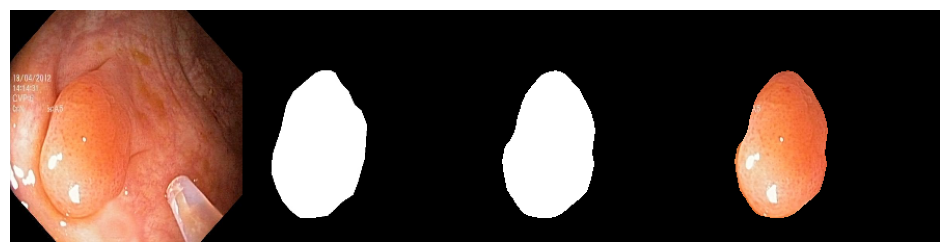

 Epoch: 9 of 100, Iter.: 100 of 100, Train Loss: 0.140071, IoU: 0.842254, Dice: 0.905547
 Epoch: 9 of 100, Iter.: 100 of 100, Valid Loss: 0.336024, IoU: 0.768965, Dice: 0.853640


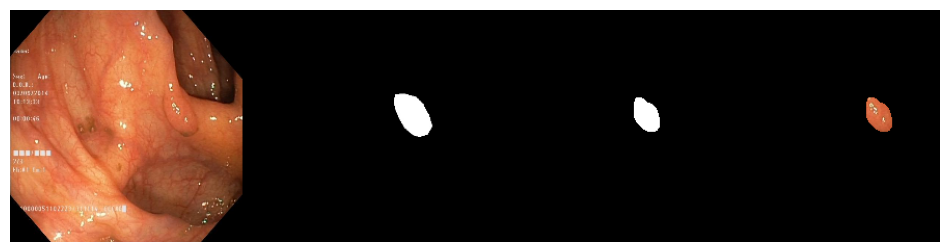

 Epoch: 10 of 100, Iter.: 100 of 100, Train Loss: 0.120667, IoU: 0.855551, Dice: 0.914606
 Epoch: 10 of 100, Iter.: 100 of 100, Valid Loss: 0.338985, IoU: 0.782362, Dice: 0.862831


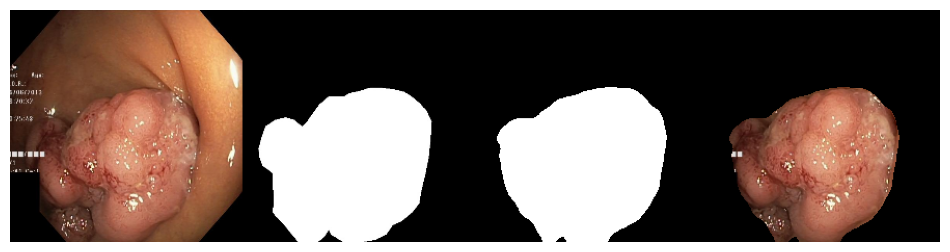

 Epoch: 11 of 100, Iter.: 100 of 100, Train Loss: 0.111571, IoU: 0.868184, Dice: 0.923988
 Epoch: 11 of 100, Iter.: 100 of 100, Valid Loss: 0.304388, IoU: 0.781784, Dice: 0.863008


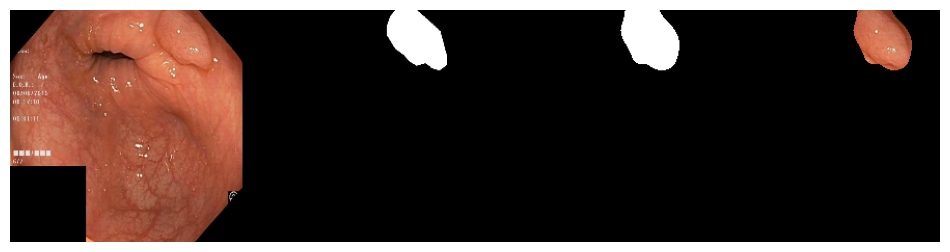

 Epoch: 12 of 100, Iter.: 100 of 100, Train Loss: 0.106374, IoU: 0.870992, Dice: 0.925397
 Epoch: 12 of 100, Iter.: 100 of 100, Valid Loss: 0.325015, IoU: 0.790529, Dice: 0.869149


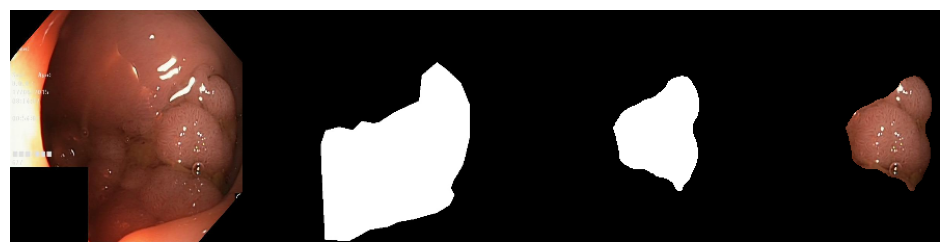

 Epoch: 13 of 100, Iter.: 100 of 100, Train Loss: 0.104418, IoU: 0.876632, Dice: 0.930308
 Epoch: 13 of 100, Iter.: 100 of 100, Valid Loss: 0.305245, IoU: 0.792888, Dice: 0.870405


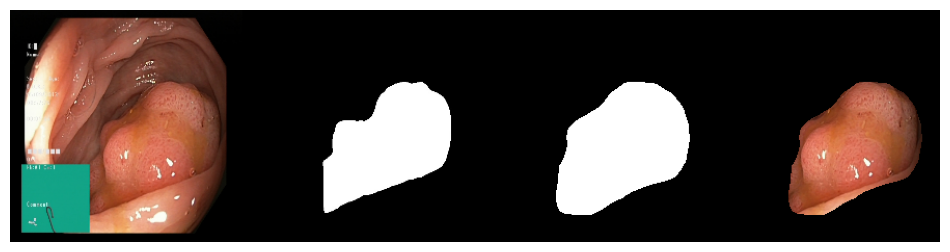

 Epoch: 14 of 100, Iter.: 100 of 100, Train Loss: 0.105494, IoU: 0.878750, Dice: 0.932156
 Epoch: 14 of 100, Iter.: 100 of 100, Valid Loss: 0.332503, IoU: 0.787010, Dice: 0.865012


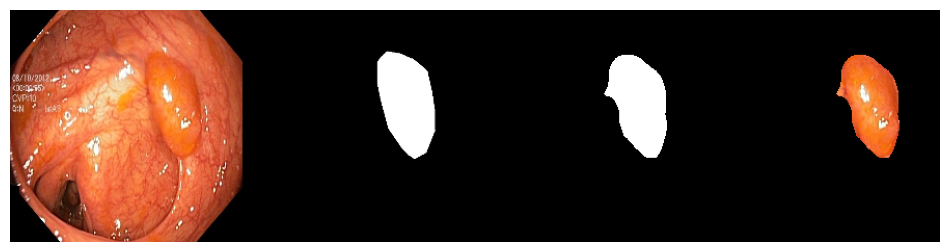

 Epoch: 15 of 100, Iter.: 100 of 100, Train Loss: 0.101495, IoU: 0.877757, Dice: 0.930426
 Epoch: 15 of 100, Iter.: 100 of 100, Valid Loss: 0.330048, IoU: 0.792004, Dice: 0.869756


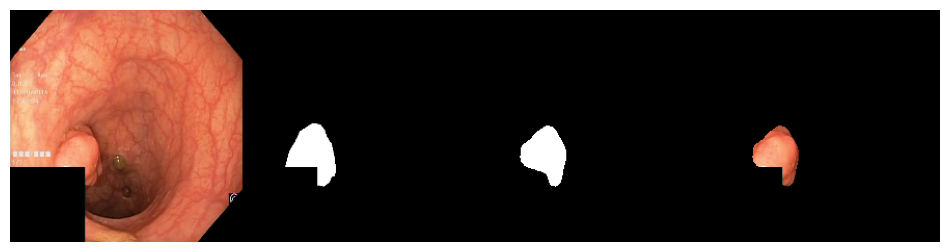

 Epoch: 16 of 100, Iter.: 100 of 100, Train Loss: 0.098450, IoU: 0.881929, Dice: 0.932855
 Epoch: 16 of 100, Iter.: 100 of 100, Valid Loss: 0.330114, IoU: 0.785686, Dice: 0.865009


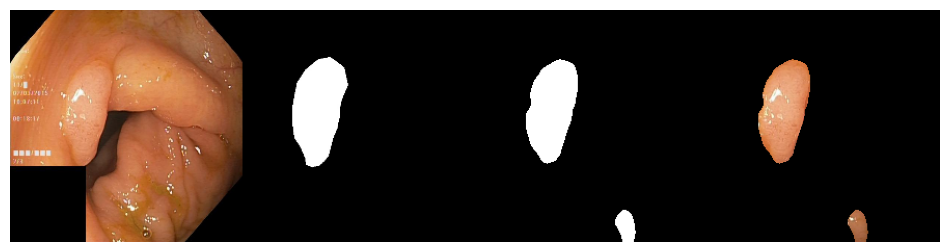

 Epoch: 17 of 100, Iter.: 100 of 100, Train Loss: 0.111635, IoU: 0.872714, Dice: 0.926137
 Epoch: 17 of 100, Iter.: 100 of 100, Valid Loss: 0.322076, IoU: 0.784053, Dice: 0.863326


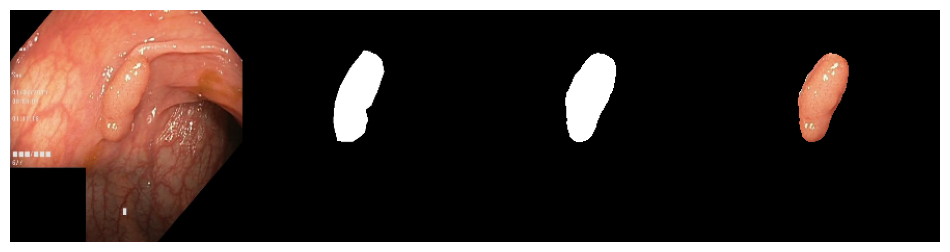

 Epoch: 18 of 100, Iter.: 100 of 100, Train Loss: 0.088693, IoU: 0.892890, Dice: 0.940799
 Epoch: 18 of 100, Iter.: 100 of 100, Valid Loss: 0.334162, IoU: 0.795194, Dice: 0.871646


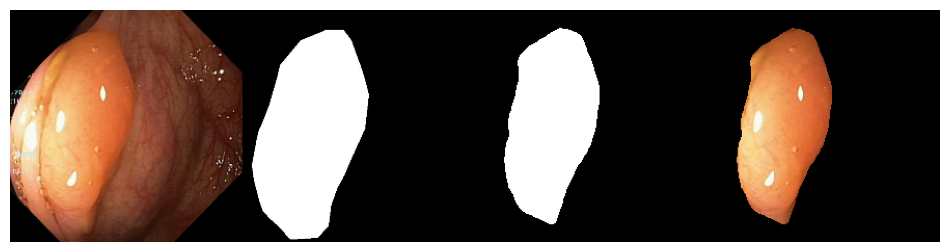

 Epoch: 19 of 100, Iter.: 100 of 100, Train Loss: 0.081162, IoU: 0.899417, Dice: 0.943882
 Epoch: 19 of 100, Iter.: 100 of 100, Valid Loss: 0.317490, IoU: 0.800891, Dice: 0.875139


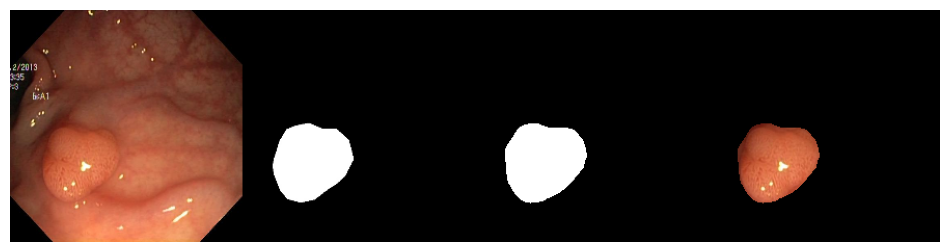

 Epoch: 20 of 100, Iter.: 100 of 100, Train Loss: 0.076296, IoU: 0.904518, Dice: 0.946772
 Epoch: 20 of 100, Iter.: 100 of 100, Valid Loss: 0.341085, IoU: 0.805194, Dice: 0.878295


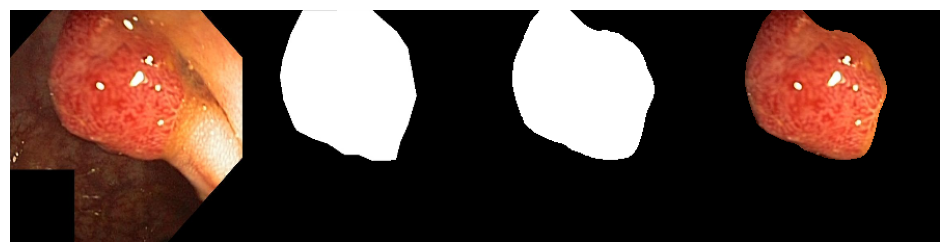

 Epoch: 21 of 100, Iter.: 100 of 100, Train Loss: 0.072482, IoU: 0.908539, Dice: 0.949621
 Epoch: 21 of 100, Iter.: 100 of 100, Valid Loss: 0.313668, IoU: 0.801160, Dice: 0.875173


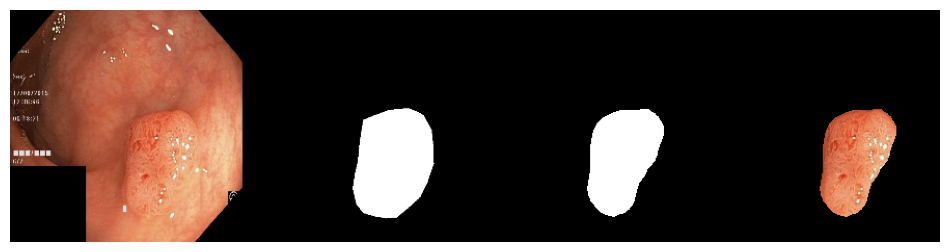

 Epoch: 22 of 100, Iter.: 100 of 100, Train Loss: 0.069733, IoU: 0.909317, Dice: 0.949706
 Epoch: 22 of 100, Iter.: 100 of 100, Valid Loss: 0.360193, IoU: 0.806145, Dice: 0.879529


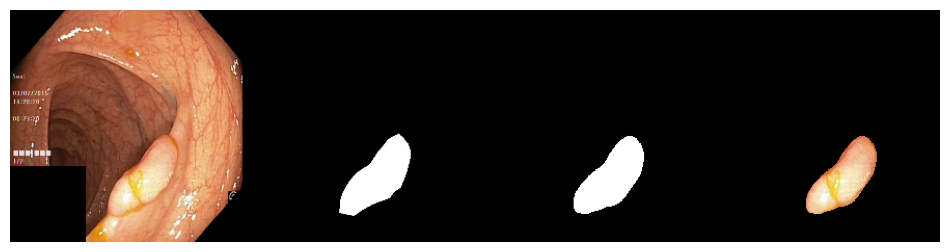

 Epoch: 23 of 100, Iter.: 100 of 100, Train Loss: 0.067347, IoU: 0.912402, Dice: 0.951538
 Epoch: 23 of 100, Iter.: 100 of 100, Valid Loss: 0.352043, IoU: 0.807855, Dice: 0.880422


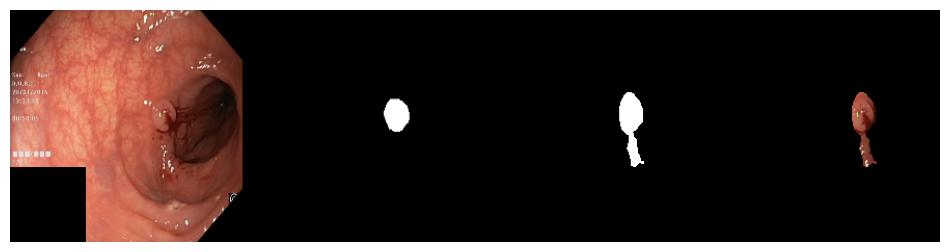

 Epoch: 24 of 100, Iter.: 100 of 100, Train Loss: 0.072231, IoU: 0.909250, Dice: 0.949999
 Epoch: 24 of 100, Iter.: 100 of 100, Valid Loss: 0.369113, IoU: 0.809210, Dice: 0.881943


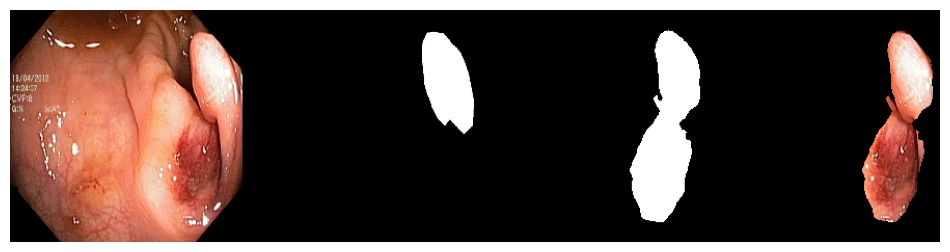

 Epoch: 25 of 100, Iter.: 100 of 100, Train Loss: 0.071283, IoU: 0.912644, Dice: 0.952586
 Epoch: 25 of 100, Iter.: 100 of 100, Valid Loss: 0.328555, IoU: 0.800841, Dice: 0.873549


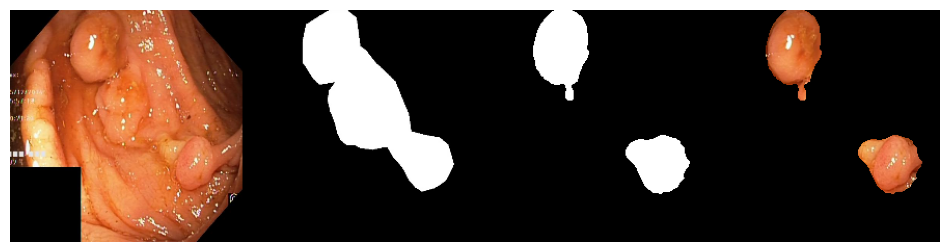

 Epoch: 26 of 100, Iter.: 100 of 100, Train Loss: 0.074236, IoU: 0.909610, Dice: 0.950793
 Epoch: 26 of 100, Iter.: 100 of 100, Valid Loss: 0.352080, IoU: 0.808820, Dice: 0.880343


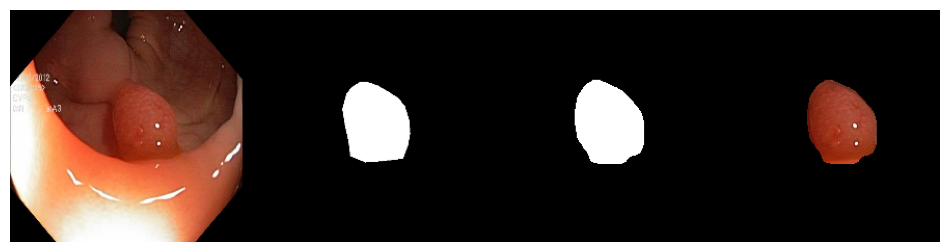

 Epoch: 27 of 100, Iter.: 100 of 100, Train Loss: 0.068117, IoU: 0.911948, Dice: 0.950914
 Epoch: 27 of 100, Iter.: 100 of 100, Valid Loss: 0.373531, IoU: 0.805164, Dice: 0.878683


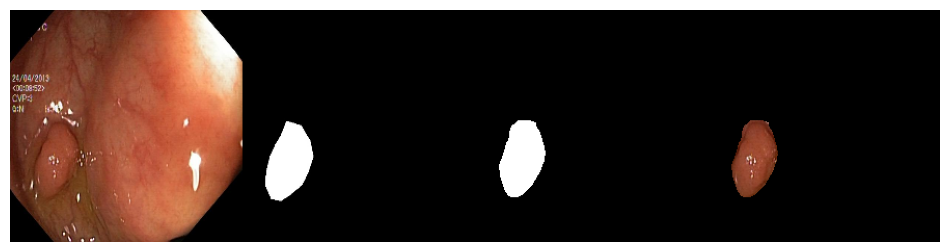

 Epoch: 28 of 100, Iter.: 100 of 100, Train Loss: 0.089359, IoU: 0.897354, Dice: 0.941890
 Epoch: 28 of 100, Iter.: 100 of 100, Valid Loss: 0.387980, IoU: 0.802343, Dice: 0.876241


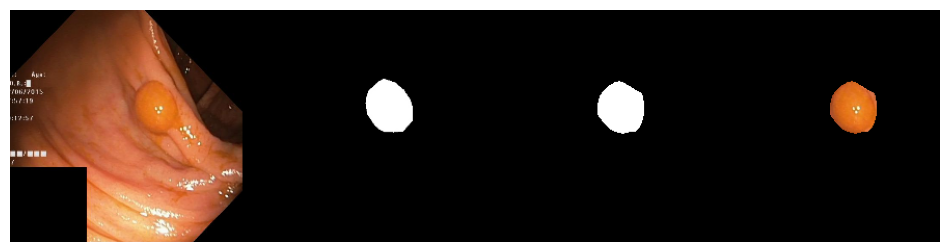

 Epoch: 29 of 100, Iter.: 100 of 100, Train Loss: 0.101756, IoU: 0.888195, Dice: 0.934744
 Epoch: 29 of 100, Iter.: 100 of 100, Valid Loss: 0.332040, IoU: 0.804466, Dice: 0.874771


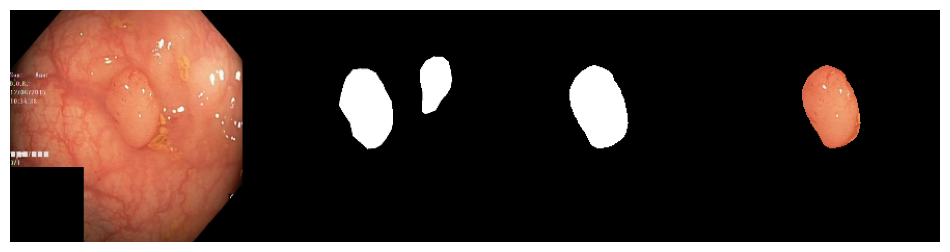

 Epoch: 30 of 100, Iter.: 100 of 100, Train Loss: 0.086802, IoU: 0.897265, Dice: 0.941883
 Epoch: 30 of 100, Iter.: 100 of 100, Valid Loss: 0.406147, IoU: 0.788026, Dice: 0.863393


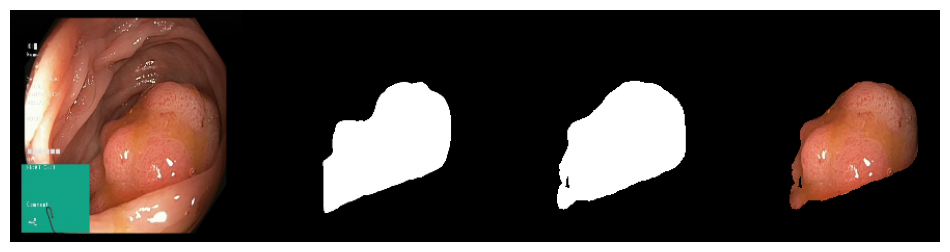

 Epoch: 31 of 100, Iter.: 100 of 100, Train Loss: 0.074449, IoU: 0.909443, Dice: 0.950550
 Epoch: 31 of 100, Iter.: 100 of 100, Valid Loss: 0.379547, IoU: 0.798388, Dice: 0.871909


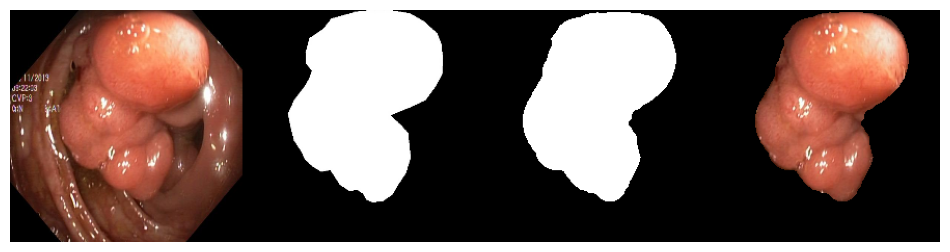

 Epoch: 32 of 100, Iter.: 100 of 100, Train Loss: 0.104483, IoU: 0.887697, Dice: 0.935254
 Epoch: 32 of 100, Iter.: 100 of 100, Valid Loss: 0.339904, IoU: 0.796949, Dice: 0.872576


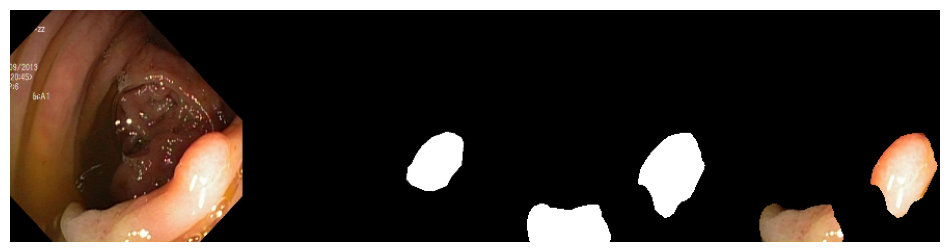

 Epoch: 33 of 100, Iter.: 100 of 100, Train Loss: 0.083075, IoU: 0.899063, Dice: 0.943566
 Epoch: 33 of 100, Iter.: 100 of 100, Valid Loss: 0.329585, IoU: 0.812854, Dice: 0.883104


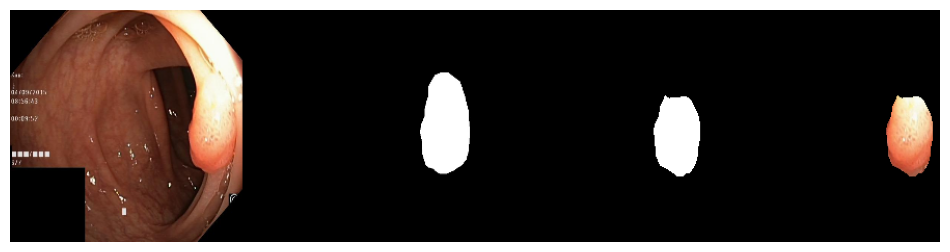

 Epoch: 34 of 100, Iter.: 100 of 100, Train Loss: 0.075766, IoU: 0.906770, Dice: 0.947895
 Epoch: 34 of 100, Iter.: 100 of 100, Valid Loss: 0.344999, IoU: 0.801570, Dice: 0.875593


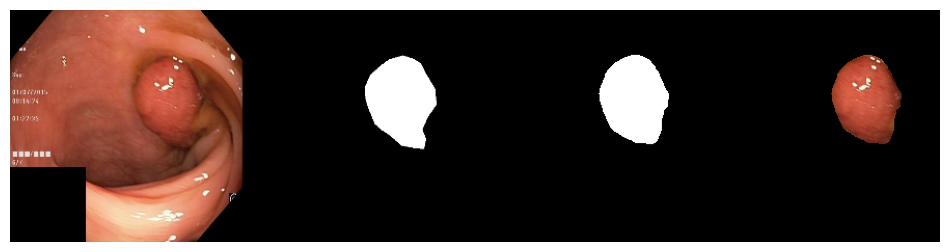

 Epoch: 35 of 100, Iter.: 100 of 100, Train Loss: 0.067382, IoU: 0.913854, Dice: 0.952288
 Epoch: 35 of 100, Iter.: 100 of 100, Valid Loss: 0.348665, IoU: 0.805931, Dice: 0.877899


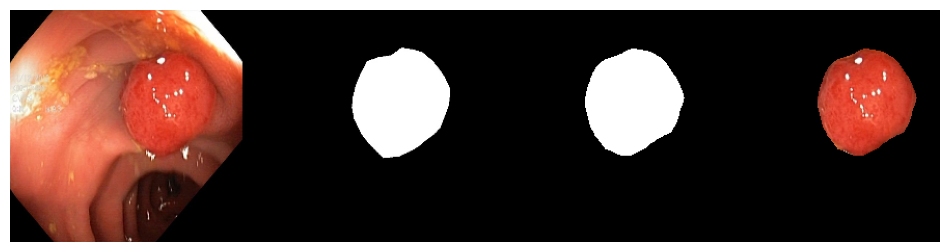

 Epoch: 36 of 100, Iter.: 100 of 100, Train Loss: 0.070071, IoU: 0.912363, Dice: 0.950965
 Epoch: 36 of 100, Iter.: 100 of 100, Valid Loss: 0.331177, IoU: 0.808032, Dice: 0.879580


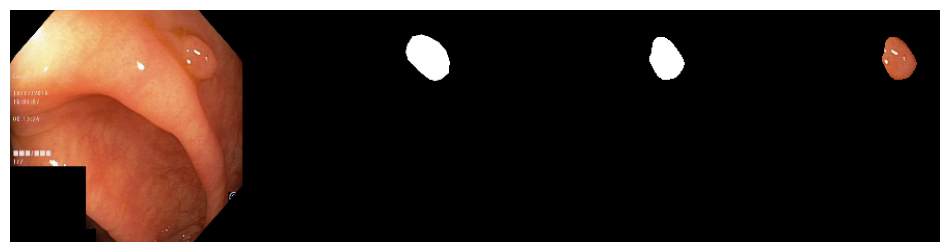

 Epoch: 37 of 100, Iter.: 100 of 100, Train Loss: 0.058800, IoU: 0.923769, Dice: 0.958481
 Epoch: 37 of 100, Iter.: 100 of 100, Valid Loss: 0.340652, IoU: 0.814756, Dice: 0.883915


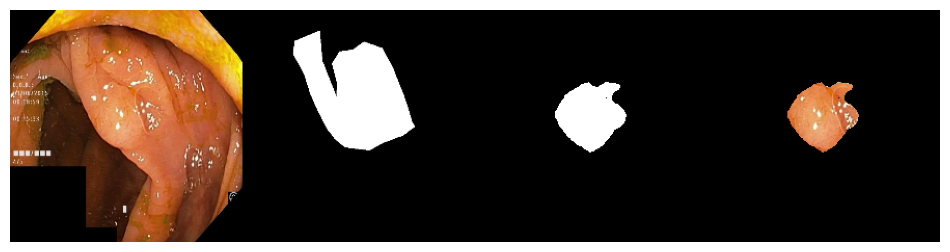

 Epoch: 38 of 100, Iter.: 100 of 100, Train Loss: 0.061698, IoU: 0.921872, Dice: 0.957521
 Epoch: 38 of 100, Iter.: 100 of 100, Valid Loss: 0.329519, IoU: 0.813829, Dice: 0.883345


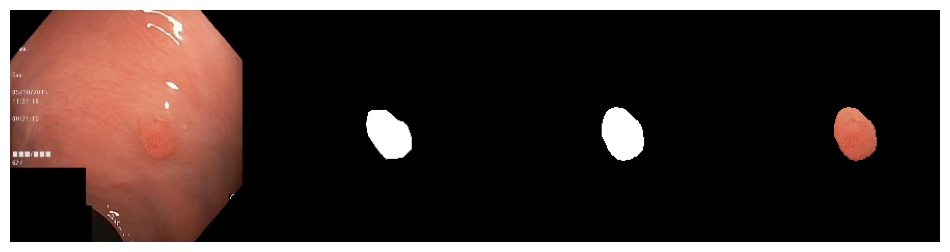

 Epoch: 39 of 100, Iter.: 100 of 100, Train Loss: 0.058263, IoU: 0.925421, Dice: 0.959518
 Epoch: 39 of 100, Iter.: 100 of 100, Valid Loss: 0.385165, IoU: 0.805470, Dice: 0.877078


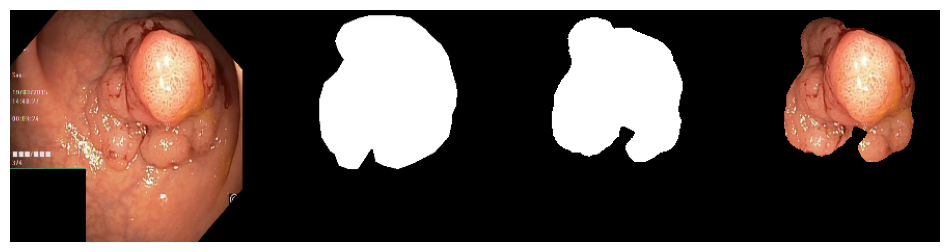

 Epoch: 40 of 100, Iter.: 100 of 100, Train Loss: 0.055835, IoU: 0.927396, Dice: 0.960275
 Epoch: 40 of 100, Iter.: 100 of 100, Valid Loss: 0.455351, IoU: 0.807746, Dice: 0.878103


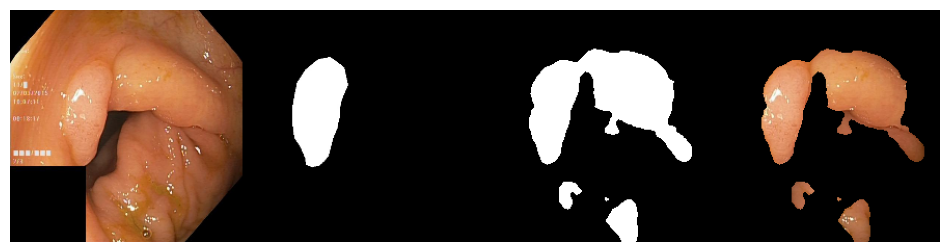

 Epoch: 41 of 100, Iter.: 100 of 100, Train Loss: 0.055398, IoU: 0.929856, Dice: 0.962629
 Epoch: 41 of 100, Iter.: 100 of 100, Valid Loss: 0.398338, IoU: 0.810177, Dice: 0.879983


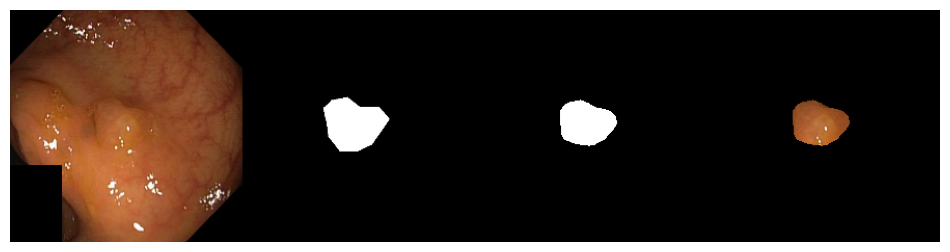

 Epoch: 42 of 100, Iter.: 100 of 100, Train Loss: 0.060792, IoU: 0.924144, Dice: 0.958718
 Epoch: 42 of 100, Iter.: 100 of 100, Valid Loss: 0.413366, IoU: 0.803567, Dice: 0.876211


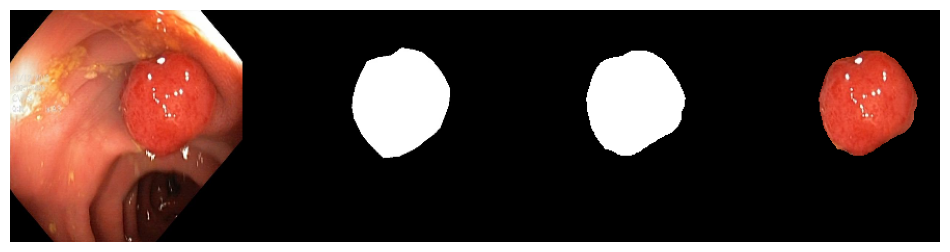

 Epoch: 43 of 100, Iter.: 100 of 100, Train Loss: 0.091014, IoU: 0.902929, Dice: 0.945511
 Epoch: 43 of 100, Iter.: 100 of 100, Valid Loss: 0.363851, IoU: 0.782627, Dice: 0.859539


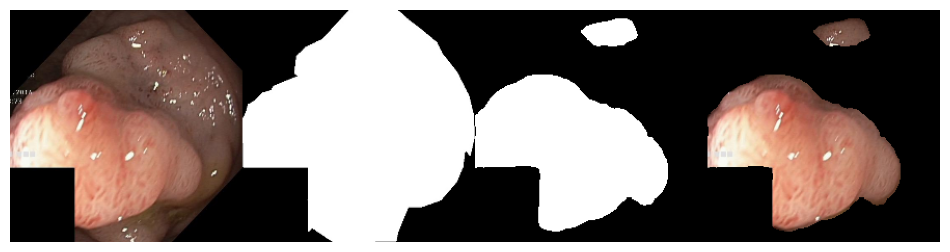

 Epoch: 44 of 100, Iter.: 100 of 100, Train Loss: 0.063301, IoU: 0.922059, Dice: 0.957322
 Epoch: 44 of 100, Iter.: 100 of 100, Valid Loss: 0.381283, IoU: 0.803843, Dice: 0.877042


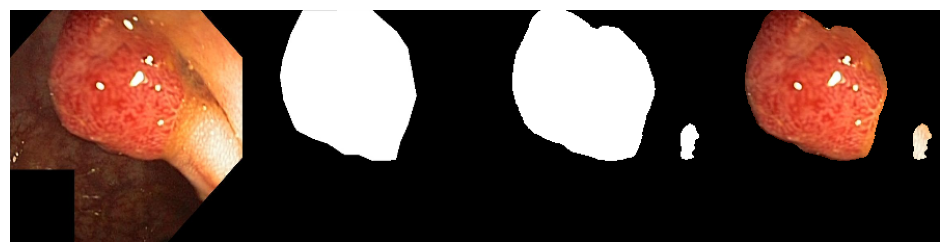

 Epoch: 45 of 100, Iter.: 100 of 100, Train Loss: 0.062945, IoU: 0.923849, Dice: 0.958841
 Epoch: 45 of 100, Iter.: 100 of 100, Valid Loss: 0.431575, IoU: 0.792993, Dice: 0.868551


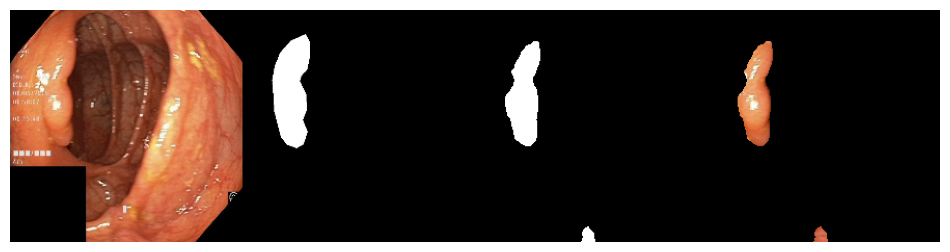

 Epoch: 46 of 100, Iter.: 100 of 100, Train Loss: 0.064520, IoU: 0.922880, Dice: 0.958032
 Epoch: 46 of 100, Iter.: 100 of 100, Valid Loss: 0.353492, IoU: 0.805990, Dice: 0.878115


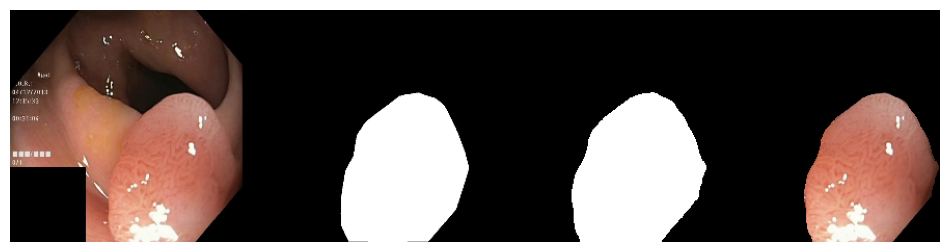

 Epoch: 47 of 100, Iter.: 100 of 100, Train Loss: 0.063281, IoU: 0.923306, Dice: 0.958682
 Epoch: 47 of 100, Iter.: 100 of 100, Valid Loss: 0.374848, IoU: 0.814110, Dice: 0.884157


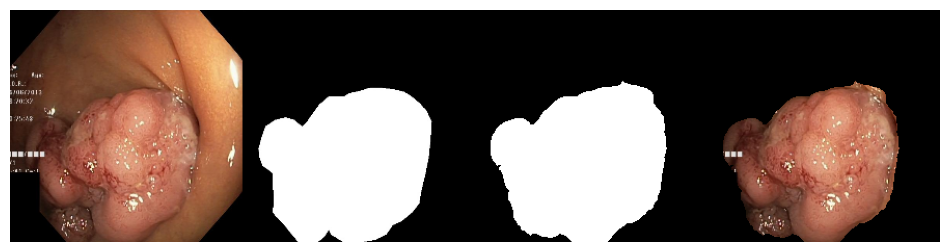

 Epoch: 48 of 100, Iter.: 100 of 100, Train Loss: 0.065524, IoU: 0.918751, Dice: 0.955029
 Epoch: 48 of 100, Iter.: 100 of 100, Valid Loss: 0.464379, IoU: 0.772633, Dice: 0.852459


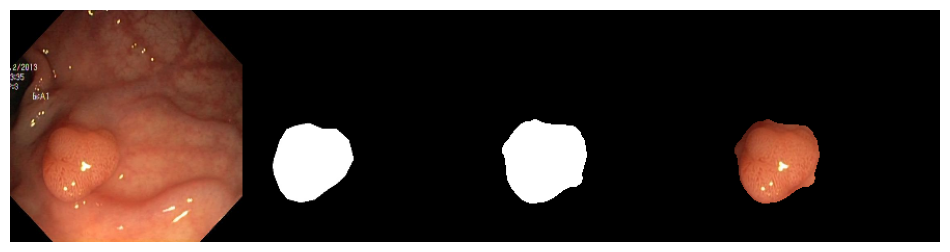

 Epoch: 49 of 100, Iter.: 100 of 100, Train Loss: 0.087004, IoU: 0.902566, Dice: 0.944315
 Epoch: 49 of 100, Iter.: 100 of 100, Valid Loss: 0.363932, IoU: 0.805469, Dice: 0.876566


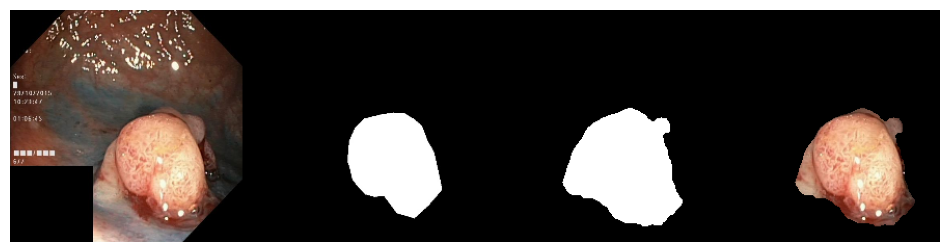

 Epoch: 50 of 100, Iter.: 100 of 100, Train Loss: 0.058405, IoU: 0.924471, Dice: 0.957841
 Epoch: 50 of 100, Iter.: 100 of 100, Valid Loss: 0.383737, IoU: 0.803585, Dice: 0.874574


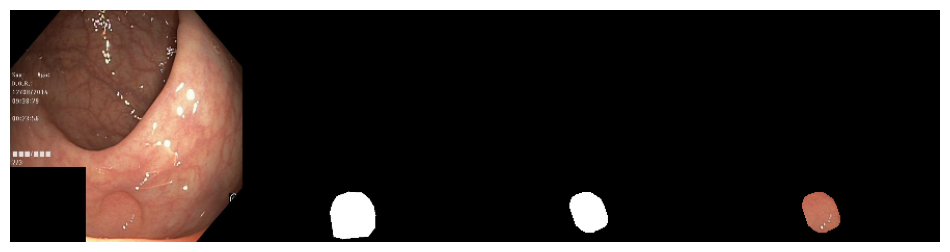

 Epoch: 51 of 100, Iter.: 100 of 100, Train Loss: 0.062055, IoU: 0.924061, Dice: 0.959000
 Epoch: 51 of 100, Iter.: 100 of 100, Valid Loss: 0.374675, IoU: 0.803232, Dice: 0.873380


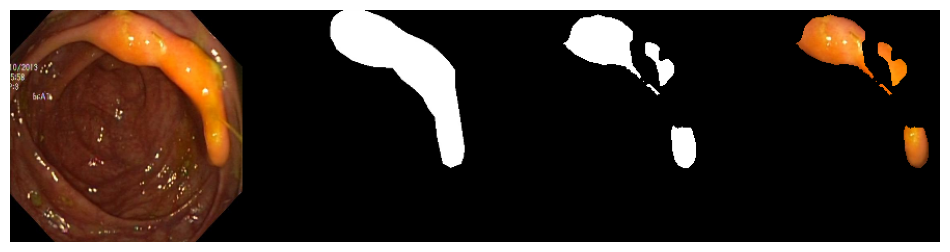

 Epoch: 52 of 100, Iter.: 100 of 100, Train Loss: 0.053282, IoU: 0.930443, Dice: 0.962462
 Epoch: 52 of 100, Iter.: 100 of 100, Valid Loss: 0.369136, IoU: 0.813259, Dice: 0.882826


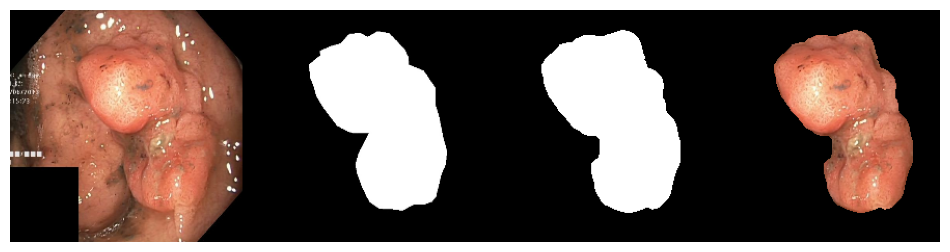

 Epoch: 53 of 100, Iter.: 100 of 100, Train Loss: 0.070487, IoU: 0.914062, Dice: 0.952335
 Epoch: 53 of 100, Iter.: 100 of 100, Valid Loss: 0.372822, IoU: 0.810361, Dice: 0.880070


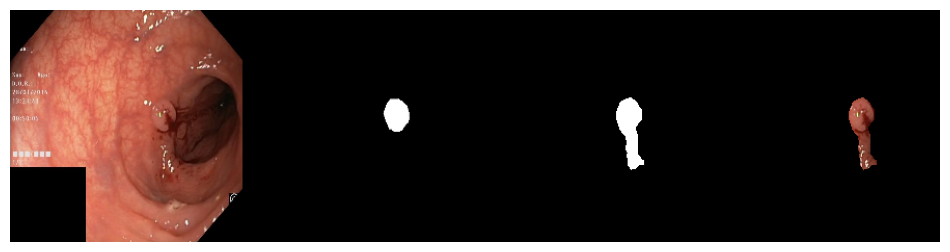

 Epoch: 54 of 100, Iter.: 100 of 100, Train Loss: 0.054378, IoU: 0.930332, Dice: 0.962749
 Epoch: 54 of 100, Iter.: 100 of 100, Valid Loss: 0.409347, IoU: 0.809592, Dice: 0.878372


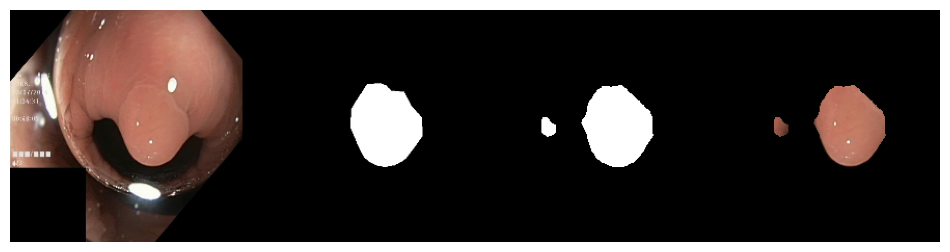

 Epoch: 55 of 100, Iter.: 100 of 100, Train Loss: 0.049278, IoU: 0.935828, Dice: 0.966016
 Epoch: 55 of 100, Iter.: 100 of 100, Valid Loss: 0.403560, IoU: 0.816024, Dice: 0.883604


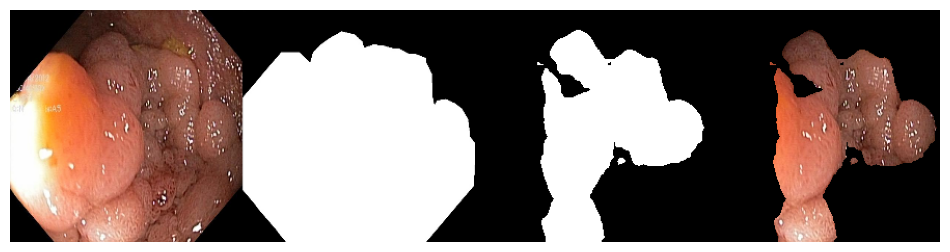

 Epoch: 56 of 100, Iter.: 100 of 100, Train Loss: 0.046043, IoU: 0.938770, Dice: 0.967040
 Epoch: 56 of 100, Iter.: 100 of 100, Valid Loss: 0.417801, IoU: 0.818764, Dice: 0.885489


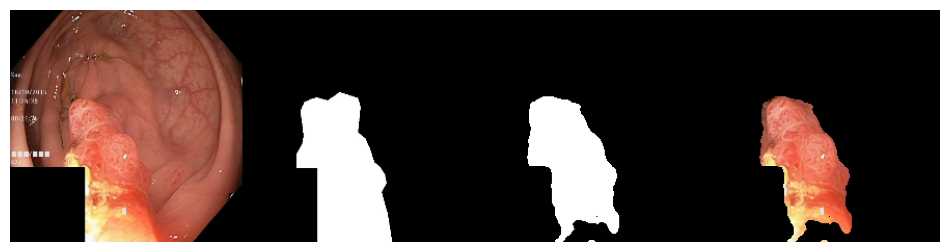

 Epoch: 57 of 100, Iter.: 100 of 100, Train Loss: 0.044614, IoU: 0.942104, Dice: 0.969646
 Epoch: 57 of 100, Iter.: 100 of 100, Valid Loss: 0.431272, IoU: 0.816246, Dice: 0.884146


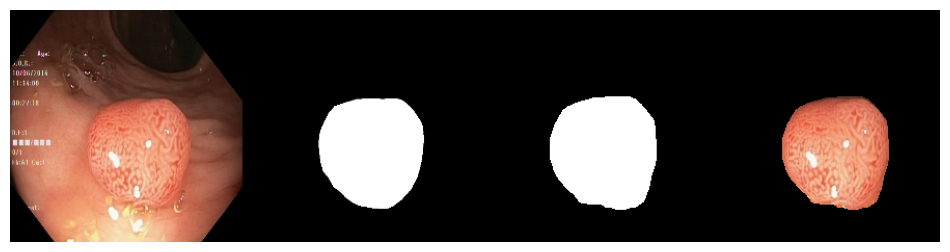

 Epoch: 58 of 100, Iter.: 100 of 100, Train Loss: 0.044287, IoU: 0.941065, Dice: 0.968591
 Epoch: 58 of 100, Iter.: 100 of 100, Valid Loss: 0.423417, IoU: 0.817953, Dice: 0.885411


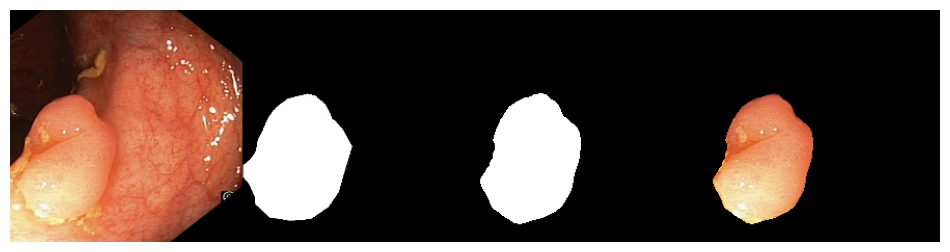

 Epoch: 59 of 100, Iter.: 100 of 100, Train Loss: 0.055146, IoU: 0.929765, Dice: 0.961278
 Epoch: 59 of 100, Iter.: 100 of 100, Valid Loss: 0.412376, IoU: 0.812406, Dice: 0.882691


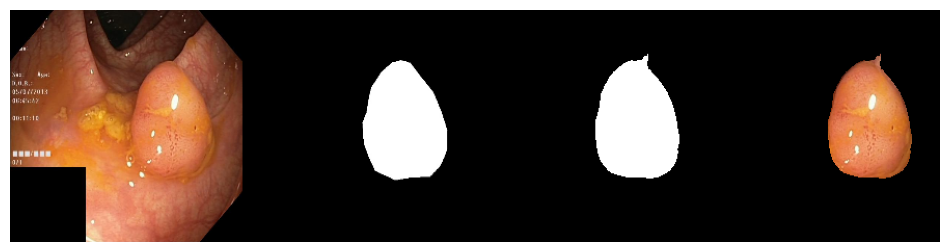

 Epoch: 60 of 100, Iter.: 100 of 100, Train Loss: 0.060517, IoU: 0.928908, Dice: 0.962039
 Epoch: 60 of 100, Iter.: 100 of 100, Valid Loss: 0.431649, IoU: 0.814971, Dice: 0.882327


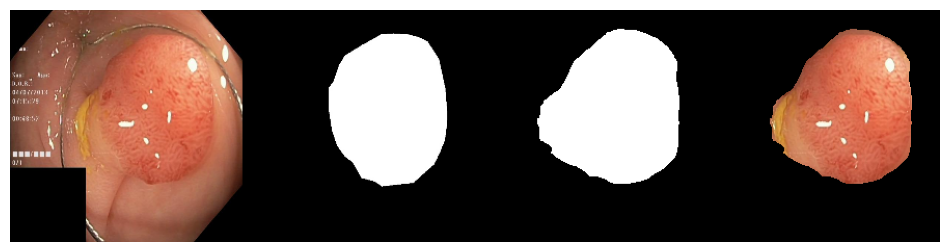

 Epoch: 61 of 100, Iter.: 100 of 100, Train Loss: 0.050579, IoU: 0.934766, Dice: 0.965306
 Epoch: 61 of 100, Iter.: 100 of 100, Valid Loss: 0.396576, IoU: 0.810910, Dice: 0.880006


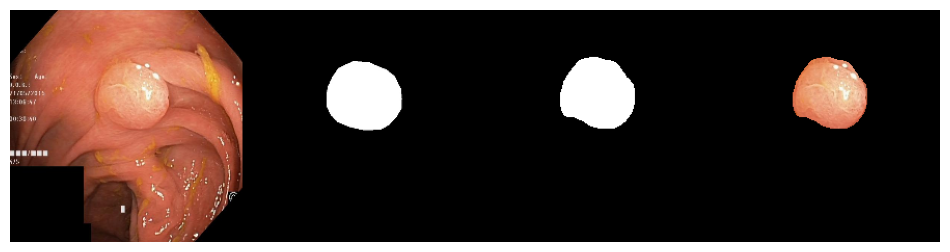

 Epoch: 62 of 100, Iter.: 100 of 100, Train Loss: 0.054559, IoU: 0.933821, Dice: 0.964082
 Epoch: 62 of 100, Iter.: 100 of 100, Valid Loss: 0.365442, IoU: 0.811385, Dice: 0.879461


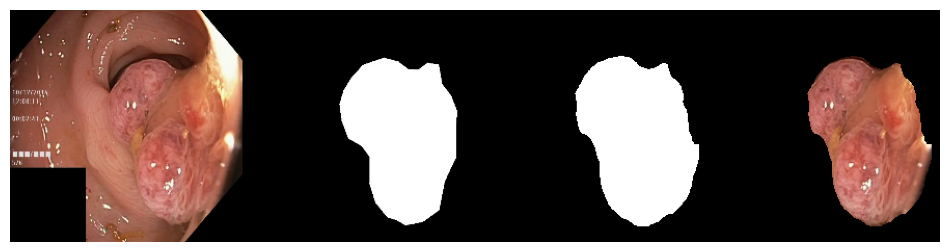

 Epoch: 63 of 100, Iter.: 100 of 100, Train Loss: 0.052279, IoU: 0.932317, Dice: 0.962849
 Epoch: 63 of 100, Iter.: 100 of 100, Valid Loss: 0.372623, IoU: 0.823069, Dice: 0.888741


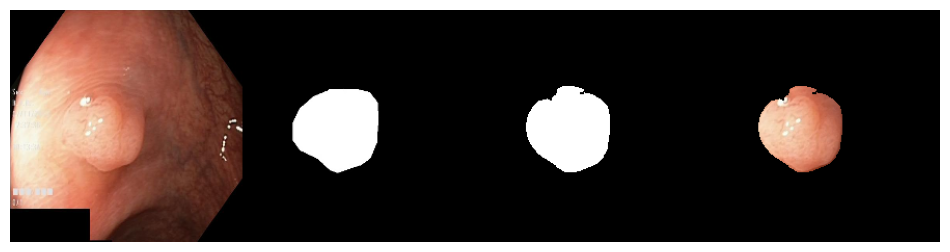

 Epoch: 64 of 100, Iter.: 100 of 100, Train Loss: 0.047335, IoU: 0.938751, Dice: 0.967497
 Epoch: 64 of 100, Iter.: 100 of 100, Valid Loss: 0.368455, IoU: 0.825390, Dice: 0.889756


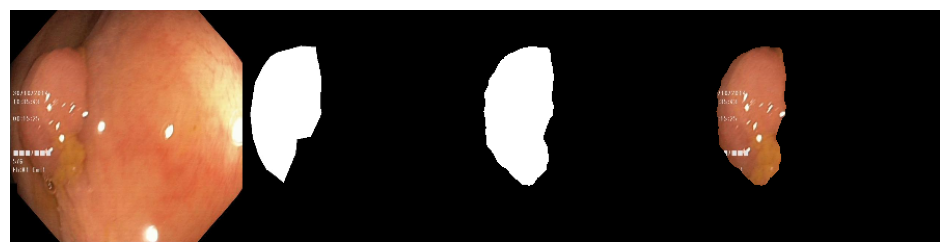

 Epoch: 65 of 100, Iter.: 100 of 100, Train Loss: 0.045369, IoU: 0.941949, Dice: 0.969344
 Epoch: 65 of 100, Iter.: 100 of 100, Valid Loss: 0.380530, IoU: 0.818712, Dice: 0.887052


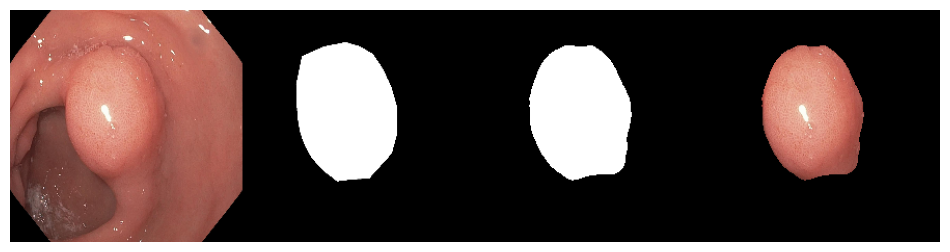

 Epoch: 66 of 100, Iter.: 100 of 100, Train Loss: 0.044212, IoU: 0.941605, Dice: 0.969211
 Epoch: 66 of 100, Iter.: 100 of 100, Valid Loss: 0.436045, IoU: 0.814229, Dice: 0.881353


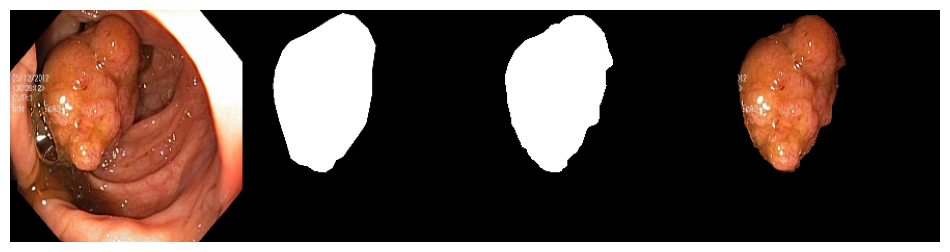

 Epoch: 67 of 100, Iter.: 100 of 100, Train Loss: 0.043187, IoU: 0.944488, Dice: 0.970957
 Epoch: 67 of 100, Iter.: 100 of 100, Valid Loss: 0.378951, IoU: 0.823405, Dice: 0.890650


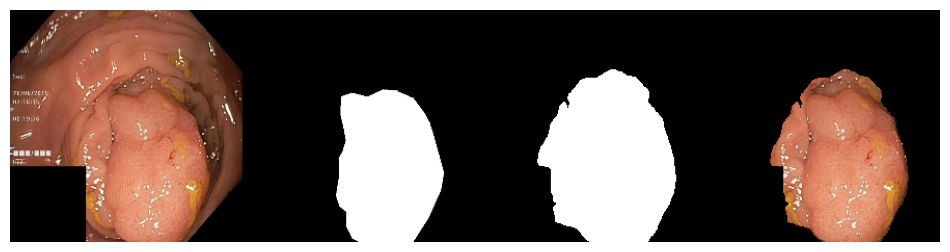

 Epoch: 68 of 100, Iter.: 100 of 100, Train Loss: 0.043848, IoU: 0.944971, Dice: 0.970986
 Epoch: 68 of 100, Iter.: 100 of 100, Valid Loss: 0.454078, IoU: 0.815602, Dice: 0.883778


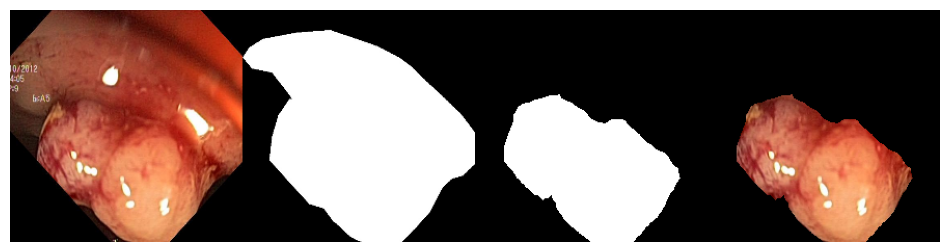

 Epoch: 69 of 100, Iter.: 100 of 100, Train Loss: 0.046541, IoU: 0.941154, Dice: 0.968787
 Epoch: 69 of 100, Iter.: 100 of 100, Valid Loss: 0.411062, IoU: 0.824807, Dice: 0.890638


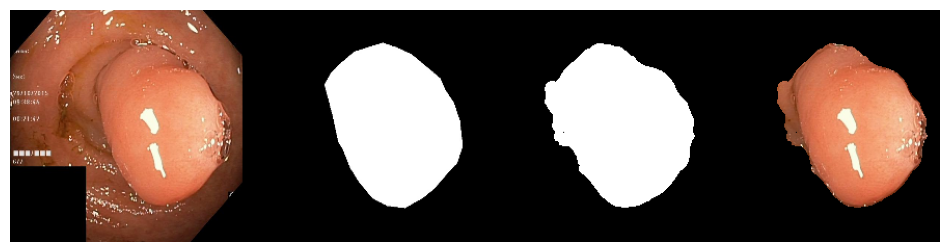

 Epoch: 70 of 100, Iter.: 100 of 100, Train Loss: 0.042192, IoU: 0.945383, Dice: 0.971153
 Epoch: 70 of 100, Iter.: 100 of 100, Valid Loss: 0.409869, IoU: 0.824822, Dice: 0.891384


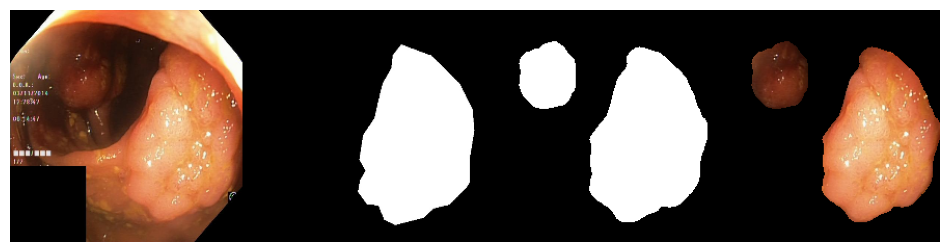

 Epoch: 71 of 100, Iter.: 100 of 100, Train Loss: 0.045053, IoU: 0.940874, Dice: 0.968395
 Epoch: 71 of 100, Iter.: 100 of 100, Valid Loss: 0.421724, IoU: 0.817182, Dice: 0.884274


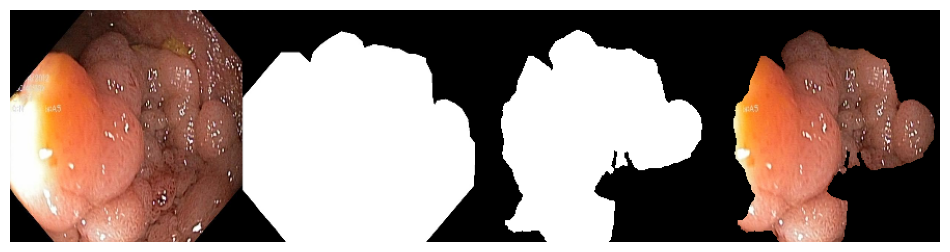

 Epoch: 72 of 100, Iter.: 100 of 100, Train Loss: 0.040327, IoU: 0.945547, Dice: 0.970937
 Epoch: 72 of 100, Iter.: 100 of 100, Valid Loss: 0.446317, IoU: 0.818088, Dice: 0.886349


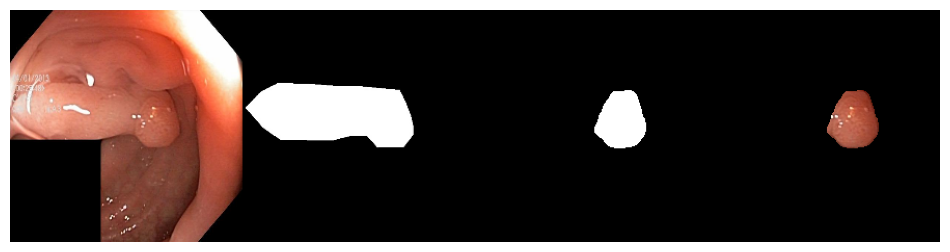

 Epoch: 73 of 100, Iter.: 100 of 100, Train Loss: 0.038940, IoU: 0.949576, Dice: 0.973527
 Epoch: 73 of 100, Iter.: 100 of 100, Valid Loss: 0.468982, IoU: 0.821452, Dice: 0.888643


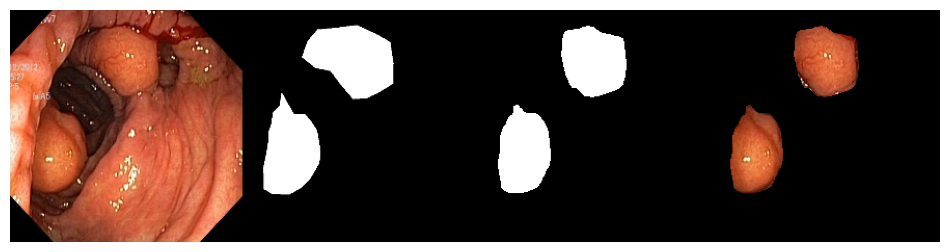

 Epoch: 74 of 100, Iter.: 100 of 100, Train Loss: 0.038426, IoU: 0.948945, Dice: 0.973288
 Epoch: 74 of 100, Iter.: 100 of 100, Valid Loss: 0.436728, IoU: 0.824699, Dice: 0.891435


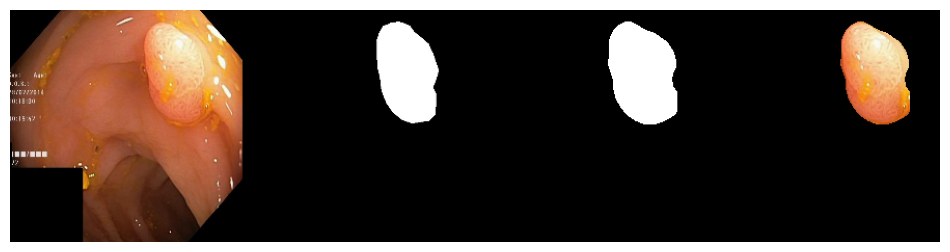

 Epoch: 75 of 100, Iter.: 100 of 100, Train Loss: 0.043281, IoU: 0.942415, Dice: 0.968897
 Epoch: 75 of 100, Iter.: 100 of 100, Valid Loss: 0.426339, IoU: 0.821465, Dice: 0.888251


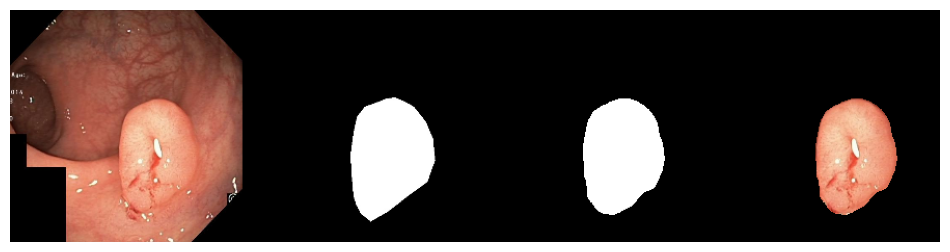

 Epoch: 76 of 100, Iter.: 100 of 100, Train Loss: 0.039793, IoU: 0.947766, Dice: 0.972477
 Epoch: 76 of 100, Iter.: 100 of 100, Valid Loss: 0.422753, IoU: 0.825805, Dice: 0.891439


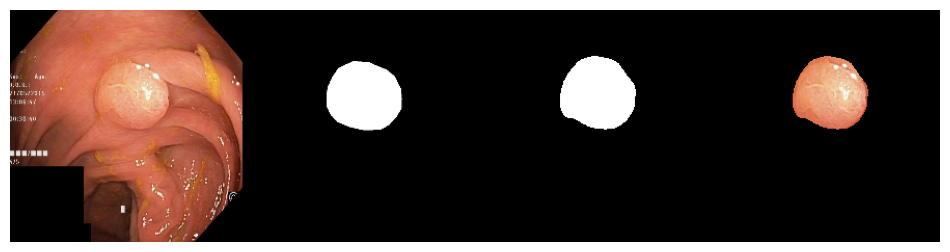

 Epoch: 77 of 100, Iter.: 100 of 100, Train Loss: 0.038351, IoU: 0.948959, Dice: 0.972785
 Epoch: 77 of 100, Iter.: 100 of 100, Valid Loss: 0.432092, IoU: 0.827225, Dice: 0.892429


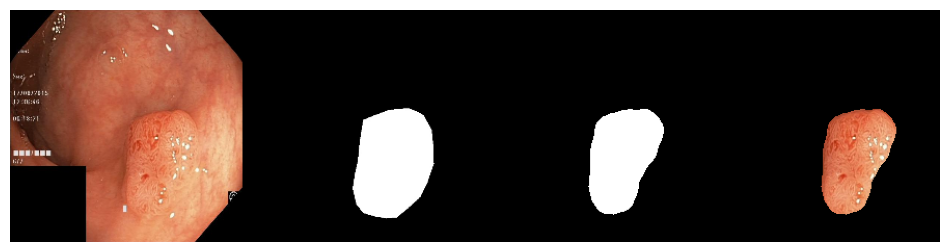

 Epoch: 78 of 100, Iter.: 100 of 100, Train Loss: 0.052811, IoU: 0.937979, Dice: 0.966217
 Epoch: 78 of 100, Iter.: 100 of 100, Valid Loss: 0.462135, IoU: 0.789046, Dice: 0.869538


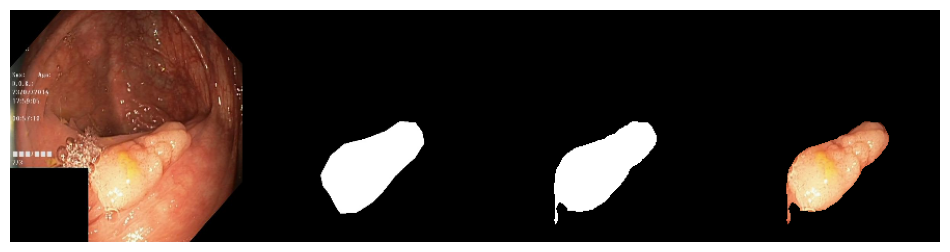

 Epoch: 79 of 100, Iter.: 100 of 100, Train Loss: 0.080237, IoU: 0.909705, Dice: 0.948198
 Epoch: 79 of 100, Iter.: 100 of 100, Valid Loss: 0.477203, IoU: 0.783455, Dice: 0.857775


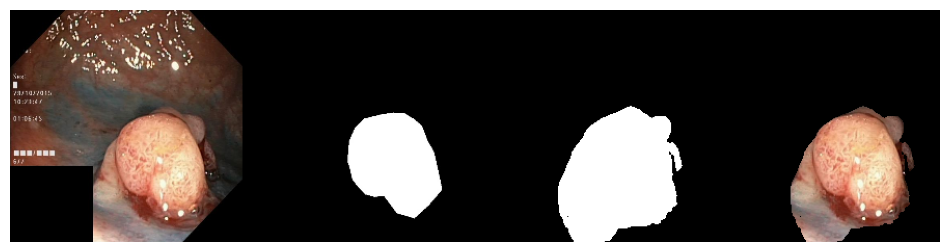

 Epoch: 80 of 100, Iter.: 100 of 100, Train Loss: 0.067008, IoU: 0.921923, Dice: 0.957017
 Epoch: 80 of 100, Iter.: 100 of 100, Valid Loss: 0.361317, IoU: 0.810653, Dice: 0.881072


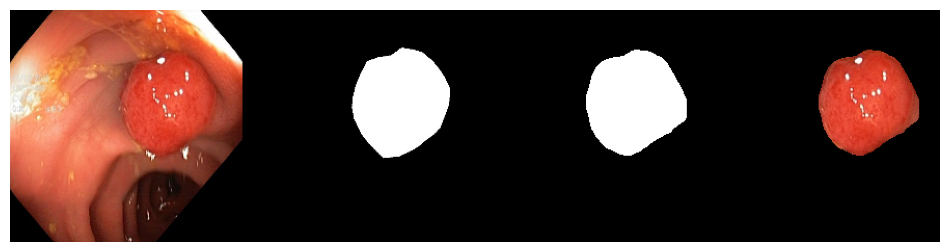

 Epoch: 81 of 100, Iter.: 100 of 100, Train Loss: 0.074086, IoU: 0.916598, Dice: 0.953895
 Epoch: 81 of 100, Iter.: 100 of 100, Valid Loss: 0.320214, IoU: 0.808859, Dice: 0.877100


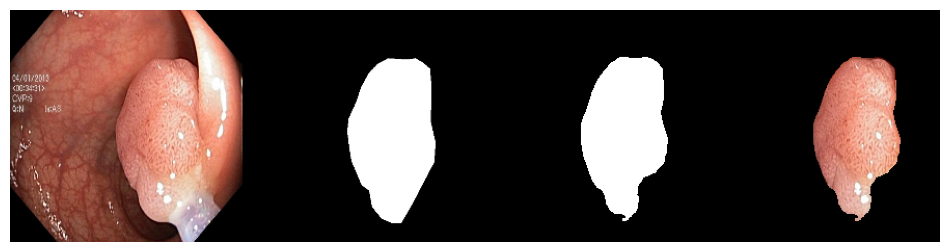

 Epoch: 82 of 100, Iter.: 100 of 100, Train Loss: 0.050173, IoU: 0.935788, Dice: 0.965907
 Epoch: 82 of 100, Iter.: 100 of 100, Valid Loss: 0.348106, IoU: 0.820479, Dice: 0.887681


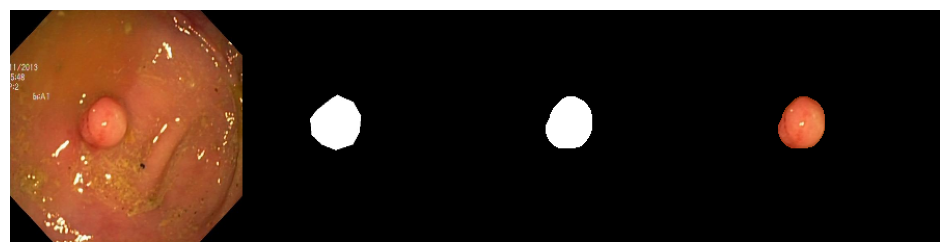

 Epoch: 83 of 100, Iter.: 100 of 100, Train Loss: 0.042912, IoU: 0.945042, Dice: 0.971280
 Epoch: 83 of 100, Iter.: 100 of 100, Valid Loss: 0.344806, IoU: 0.822191, Dice: 0.888300


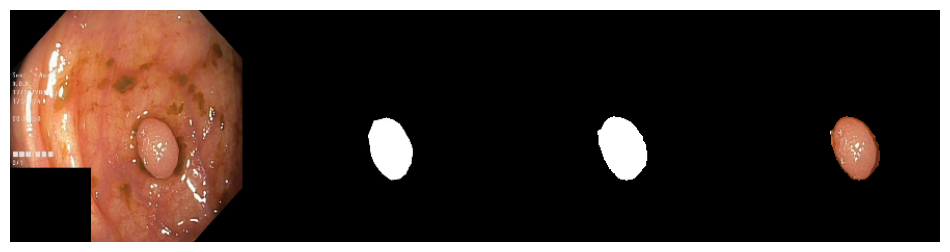

 Epoch: 84 of 100, Iter.: 100 of 100, Train Loss: 0.045217, IoU: 0.941393, Dice: 0.968143
 Epoch: 84 of 100, Iter.: 100 of 100, Valid Loss: 0.368171, IoU: 0.820040, Dice: 0.886876


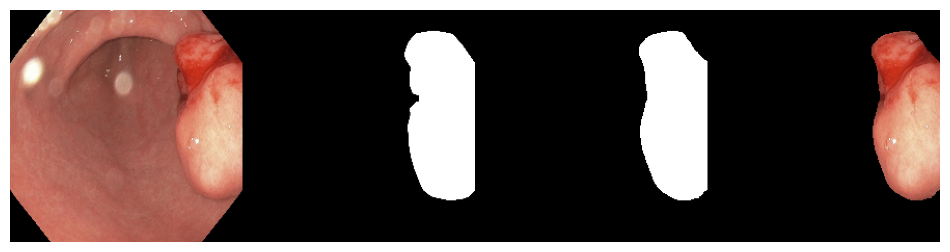

 Epoch: 85 of 100, Iter.: 100 of 100, Train Loss: 0.042519, IoU: 0.944825, Dice: 0.970491
 Epoch: 85 of 100, Iter.: 100 of 100, Valid Loss: 0.372737, IoU: 0.821997, Dice: 0.889446


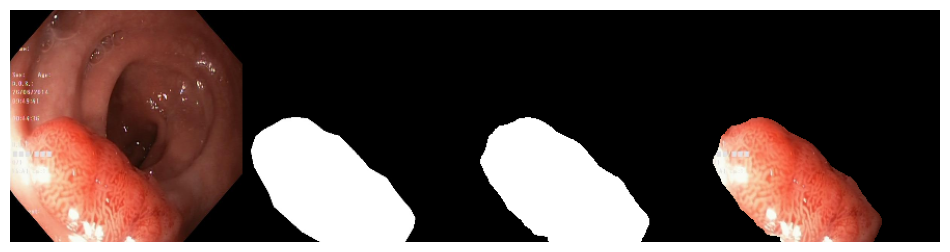

 Epoch: 86 of 100, Iter.: 100 of 100, Train Loss: 0.039569, IoU: 0.947614, Dice: 0.972308
 Epoch: 86 of 100, Iter.: 100 of 100, Valid Loss: 0.375638, IoU: 0.824990, Dice: 0.891440


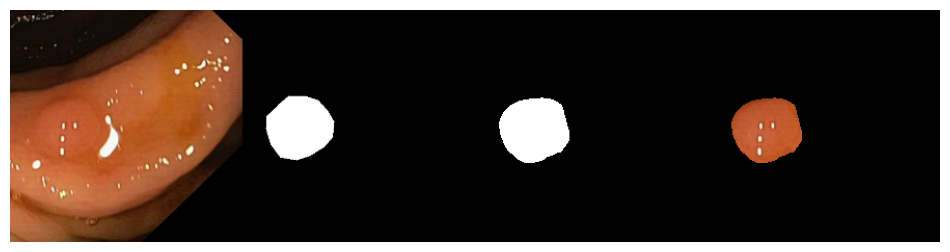

 Epoch: 87 of 100, Iter.: 100 of 100, Train Loss: 0.038337, IoU: 0.950497, Dice: 0.974254
 Epoch: 87 of 100, Iter.: 100 of 100, Valid Loss: 0.370482, IoU: 0.823907, Dice: 0.890264


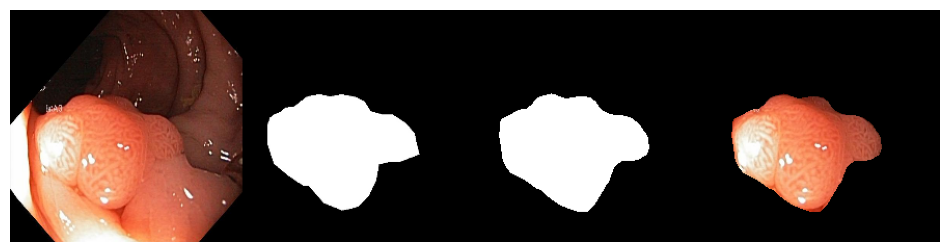

 Epoch: 88 of 100, Iter.: 100 of 100, Train Loss: 0.038773, IoU: 0.950323, Dice: 0.974154
 Epoch: 88 of 100, Iter.: 100 of 100, Valid Loss: 0.382004, IoU: 0.827643, Dice: 0.892780


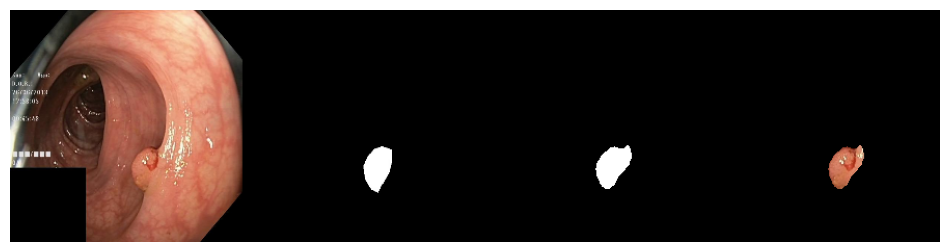

 Epoch: 89 of 100, Iter.: 100 of 100, Train Loss: 0.040911, IoU: 0.945361, Dice: 0.970577
 Epoch: 89 of 100, Iter.: 100 of 100, Valid Loss: 0.409563, IoU: 0.825189, Dice: 0.890225


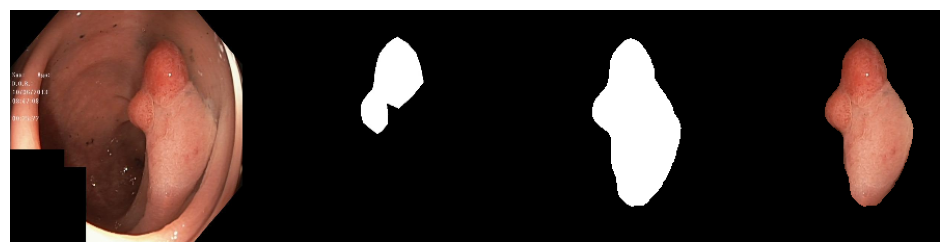

 Epoch: 90 of 100, Iter.: 100 of 100, Train Loss: 0.037284, IoU: 0.949905, Dice: 0.973584
 Epoch: 90 of 100, Iter.: 100 of 100, Valid Loss: 0.392946, IoU: 0.820043, Dice: 0.887291


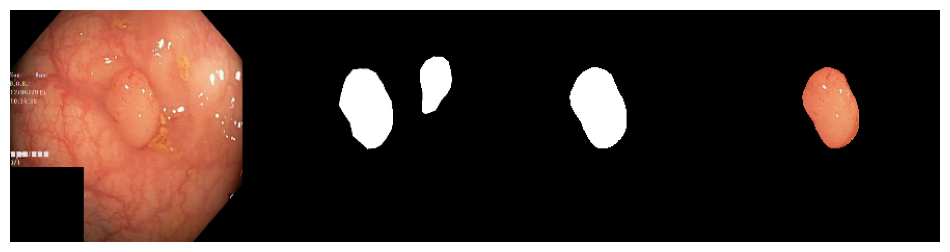

 Epoch: 91 of 100, Iter.: 100 of 100, Train Loss: 0.039570, IoU: 0.948780, Dice: 0.973200
 Epoch: 91 of 100, Iter.: 100 of 100, Valid Loss: 0.432404, IoU: 0.818844, Dice: 0.886366


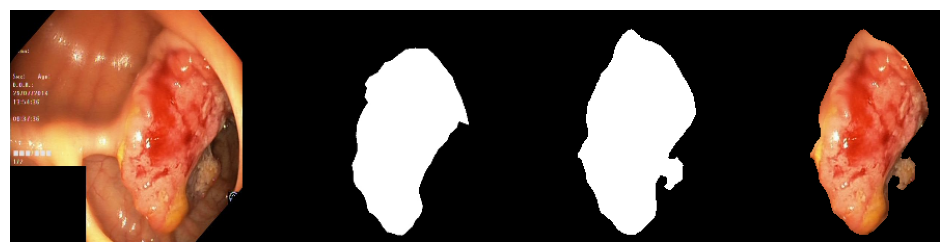

 Epoch: 92 of 100, Iter.: 100 of 100, Train Loss: 0.036115, IoU: 0.952579, Dice: 0.975315
 Epoch: 92 of 100, Iter.: 100 of 100, Valid Loss: 0.400701, IoU: 0.823960, Dice: 0.890170


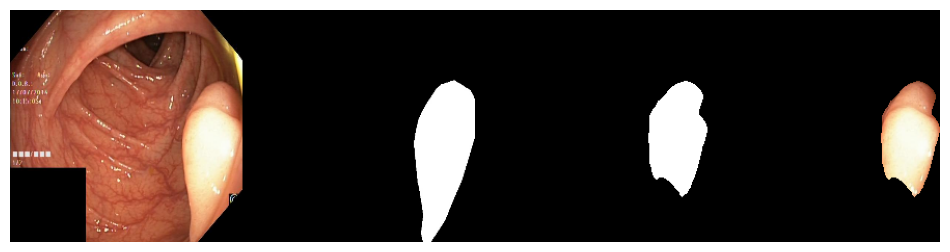

 Epoch: 93 of 100, Iter.: 100 of 100, Train Loss: 0.040408, IoU: 0.948291, Dice: 0.972073
 Epoch: 93 of 100, Iter.: 100 of 100, Valid Loss: 0.480608, IoU: 0.799030, Dice: 0.871593


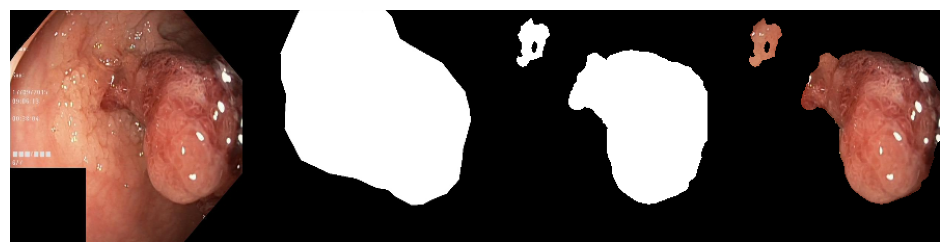

 Epoch: 94 of 100, Iter.: 100 of 100, Train Loss: 0.040767, IoU: 0.947695, Dice: 0.972373
 Epoch: 94 of 100, Iter.: 100 of 100, Valid Loss: 0.394716, IoU: 0.818380, Dice: 0.887525


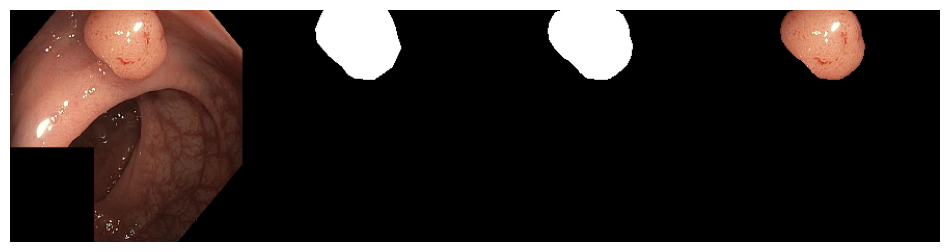

 Epoch: 95 of 100, Iter.: 100 of 100, Train Loss: 0.041200, IoU: 0.946953, Dice: 0.972127
 Epoch: 95 of 100, Iter.: 100 of 100, Valid Loss: 0.420081, IoU: 0.819557, Dice: 0.887546


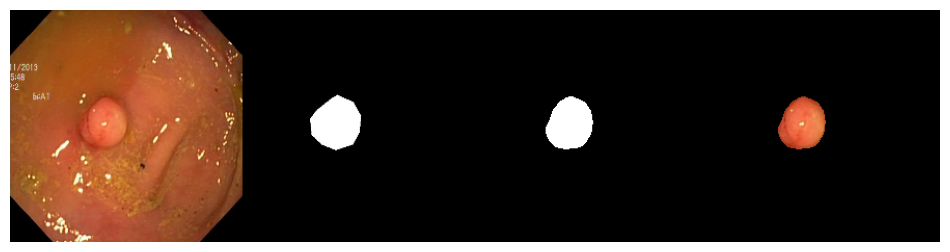

 Epoch: 96 of 100, Iter.: 100 of 100, Train Loss: 0.037808, IoU: 0.951599, Dice: 0.974642
 Epoch: 96 of 100, Iter.: 100 of 100, Valid Loss: 0.409204, IoU: 0.823520, Dice: 0.890105


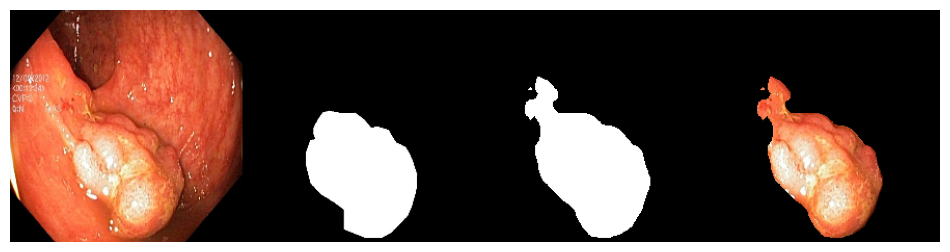

 Epoch: 97 of 100, Iter.: 100 of 100, Train Loss: 0.035164, IoU: 0.953703, Dice: 0.975926
 Epoch: 97 of 100, Iter.: 100 of 100, Valid Loss: 0.422650, IoU: 0.823537, Dice: 0.890082


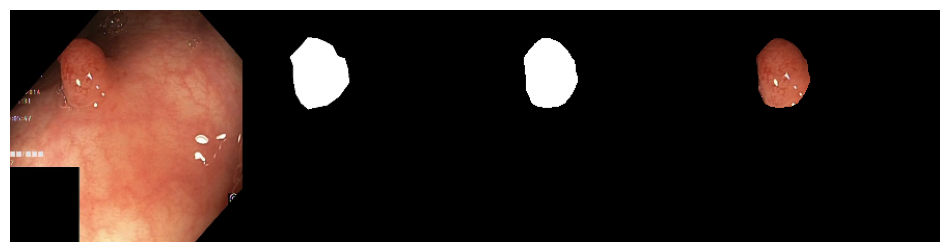

 Epoch: 98 of 100, Iter.: 100 of 100, Train Loss: 0.034436, IoU: 0.955348, Dice: 0.976877
 Epoch: 98 of 100, Iter.: 100 of 100, Valid Loss: 0.411866, IoU: 0.825830, Dice: 0.891710


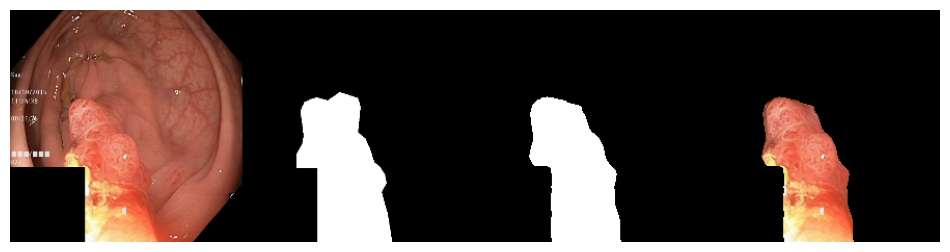

 Epoch: 99 of 100, Iter.: 100 of 100, Train Loss: 0.033702, IoU: 0.954825, Dice: 0.976461
 Epoch: 99 of 100, Iter.: 100 of 100, Valid Loss: 0.412724, IoU: 0.825971, Dice: 0.891905


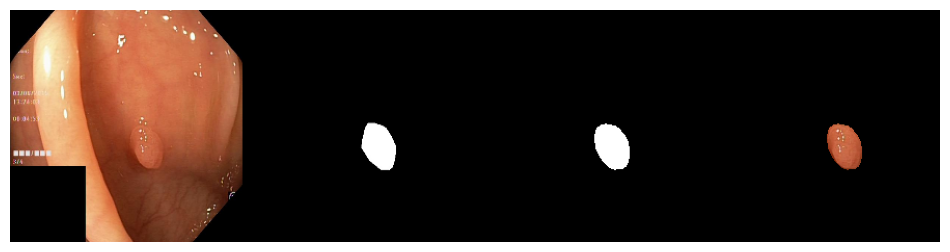

 Epoch: 100 of 100, Iter.: 100 of 100, Train Loss: 0.034585, IoU: 0.954436, Dice: 0.975755
 Epoch: 100 of 100, Iter.: 100 of 100, Valid Loss: 0.460577, IoU: 0.822384, Dice: 0.889489


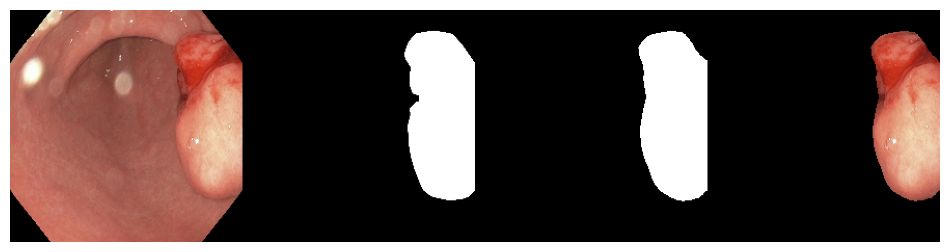

CPU times: user 36min 26s, sys: 20min 58s, total: 57min 24s
Wall time: 50min 2s


In [12]:
%%time
from ploting import plot_model_prediction

train_losses, val_losses = [], []
train_ious, val_ious = [], []
train_dices, val_dices = [], []
best_iou, best_dice, best_loss = 0, 0, np.inf
best_epoch_dice = -1
state = {}
lst_epoch_metric = []

start_time = time.time()
for epoch in range(1, epochs+1):
    running_loss, running_iou, running_dice = 0, 0, 0

    # Train
    model.train()
    for i, (imgs, masks) in enumerate(dataloader_train):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        
        optimizer.zero_grad()
        loss = criterion(prediction, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        running_iou += iou_pytorch_eval(prediction, masks)
        running_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, IoU:  {:.6f},  Dice:  {:.6f}".format(epoch, epochs, i, len(dataloader_train), running_loss/(i+1), running_iou/(i+1), running_dice/(i+1)), end="")
        
    # Validate
    model.eval()
    val_loss, val_iou, val_dice = 0, 0, 0
    for i, (imgs, masks) in enumerate(dataloader_val):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        loss = criterion(prediction, masks)
        val_loss += loss.item()
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, Val. Loss: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_loss/len(dataloader_train), val_loss/(i+1)), end="")
        
        val_iou += iou_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, IoU: {:.6f}, Val. IoU: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_iou/len(dataloader_train), val_iou/(i+1)), end="")

        val_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Dice: {:.6f}, Val. Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_dice/len(dataloader_train), val_dice/(i+1)), end="")
    
    
    # compute overall epoch losses
    epoch_train_loss = running_loss/len(dataloader_train)
    train_losses.append(epoch_train_loss)
    epoch_val_loss = val_loss/len(dataloader_val)
    val_losses.append(epoch_val_loss)

    # compute overall epoch iou-s
    epoch_train_iou = (running_iou/len(dataloader_train)).item()
    train_ious.append(epoch_train_iou)
    epoch_val_iou = (val_iou/len(dataloader_val)).item()
    val_ious.append(epoch_val_iou)
    
    # compute overall epoch dice
    epoch_train_dice = (running_dice/len(dataloader_train)).item()
    train_dices.append(epoch_train_dice)
    epoch_val_dice = (val_dice/len(dataloader_val)).item()
    val_dices.append(epoch_val_dice)

    print("\r Epoch: {} of {}, Iter.: {} of {}, Train Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_train_loss, epoch_train_iou, epoch_train_dice))
    print("\r Epoch: {} of {}, Iter.: {} of {}, Valid Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_val_loss, epoch_val_iou, epoch_val_dice))
    
    if epoch == 1:
        print('\n시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.')
    plot_model_prediction(model, DEVICE, valid_images, valid_labels)
        
    # plot
    metrics = {'loss':[train_losses, epoch_train_loss, val_losses, epoch_val_loss],
               'Iou':[train_ious, epoch_train_iou, val_ious,  epoch_val_iou],
               'Dice':[train_dices, epoch_train_dice, val_dices,  epoch_val_dice]}
    
    lst_epoch_metric.append([round(epoch_train_loss,4), round(epoch_train_iou,4), round(epoch_train_dice,4), 
                             round(epoch_val_loss,4), round(epoch_val_iou,4), round(epoch_val_dice,4)]) 

    # save if best results or break is has not improved for {patience} number of epochs
    best_iou = max(best_iou, epoch_val_iou)
    best_dice = max(best_dice, epoch_val_dice)
    best_loss = min(best_loss, epoch_val_loss)
    best_epoch_dice = epoch if best_dice == epoch_val_dice else best_epoch_dice

    # record losses
    state['train_losses'] = train_losses
    state['val_losses'] = val_losses
    
    if best_epoch_dice == epoch:
        # print('Saving..')
        state['net'] = model.state_dict()
        state['dice'] = best_dice
        state['epoch'] = epoch
            
        if not os.path.isdir('checkpoints'):
            os.mkdir('checkpoints')
        torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
    
    
    elif best_epoch_dice + patience < epoch:
        print(f"\nEarly stopping. Target criteria has not improved for {patience} epochs.\n")
        break

file_name = f'{model_name}_{data_name}'
# load once more and write all the losses down (othw can miss the last 10)
end_time = time.time() - start_time

state = torch.load(f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
state['train_losses'] = train_losses
state['val_losses'] = val_losses
torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')

df_epoch_metric = pd.DataFrame(lst_epoch_metric, columns = ['epoch_train_loss', 'epoch_train_iou', 'epoch_train_dice', 'epoch_val_loss', 'epoch_val_iou', 'epoch_val_dice'])
df_epoch_metric.to_csv(f'/project/segmentation/ehdgus575/training_{model_name}/csv_{file_name}.csv', index_label = ['epoch'])

Validationset 기준 
Best_epoch:88, Best_IOU:0.8276, Best_DiceScore:0.8928


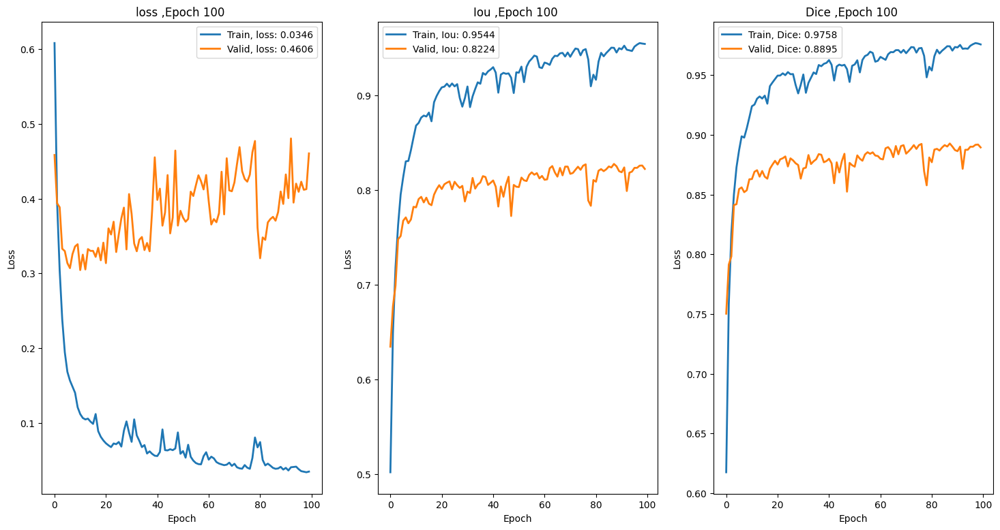

In [13]:
print(f'Validationset 기준 \nBest_epoch:{best_epoch_dice}, Best_IOU:{best_iou:.4f}, Best_DiceScore:{best_dice:.4f}')
#print(f'End_time: {end_time}')

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 9))           
for i, (metric, value) in enumerate(metrics.items()):
    axs[i].plot(np.arange(len(value[0])), value[0], label=f'Train, {metric}: {value[1]:.4f}', linewidth=2)
    axs[i].plot(np.arange(len(value[2])), value[2], label=f'Valid, {metric}: {value[3]:.4f}', linewidth=2)
    axs[i].set_xlabel('Epoch')
    axs[i].set_ylabel('Loss')
    axs[i].set_title(f'{metric} ,Epoch {epoch} ')
    axs[i].legend(loc='best')
plt.show()